In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy.external as sce
import anndata
import harmonypy as hm
import os
from scipy.sparse import csr_matrix #für die sparse matrix
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
from scipy import stats
random_state=10


Matplotlib created a temporary cache directory at /tmp/matplotlib-7gdlx7_z because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.24.4 scipy==1.11.3 pandas==2.2.3 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.6 pynndescent==0.5.13


In [3]:
adata=sc.read_h5ad('/data2/core-med1/elindber/PROJECTS/20231020_el_Xenotransplant/results/20240220_el_Xenotransplant_BR_LYMPH_BABOON_RAW.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 3863 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'

# Preprocessing

In [9]:
#sc.pl.highest_expr_genes(adata, n_top=20)

In [7]:
#sc.pp.filter_cells(adata, min_genes=200)
#sc.pp.filter_genes(adata, min_cells=3)

In [8]:
# adata.var["mt"] = adata.var_names.str.startswith("MT-")
#sc.pp.calculate_qc_metrics(
#    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
#)

In [9]:
#sc.pl.violin(
#    adata,
#    ["n_genes", "n_counts", "percent_mito"],
#    jitter=0.4,
#    multi_panel=True,
#)

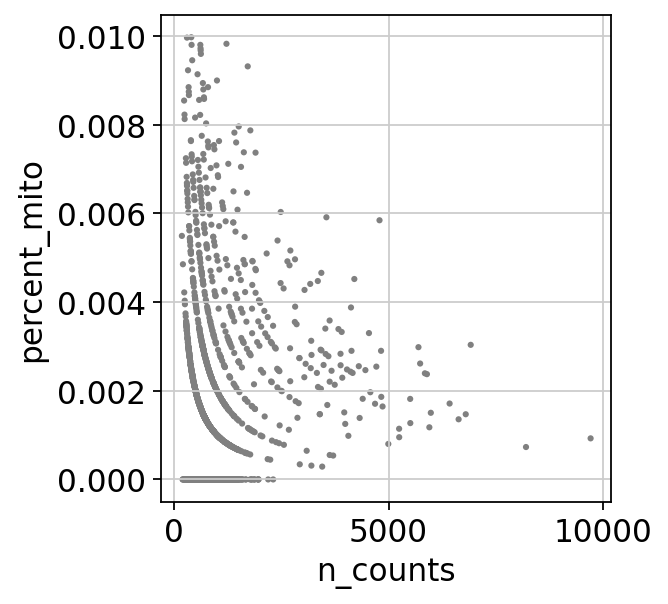

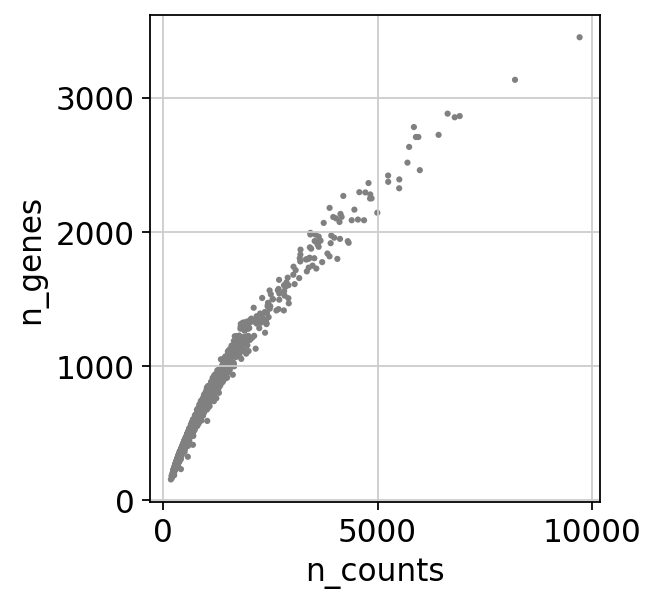

In [6]:
sc.pl.scatter(adata, x="n_counts", y="percent_mito")
sc.pl.scatter(adata, x="n_counts", y="n_genes")

In [7]:
adata = adata[adata.obs.n_genes <1500, :]
#adata = adata[adata.obs.percent_mito < 5, :].copy()

In [8]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [9]:
sc.pp.log1p(adata)

In [10]:
adata

AnnData object with n_obs × n_vars = 3774 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints'
    var: 'Average_expression'
    uns: 'Sample_ID_colors', 'log1p'

In [11]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


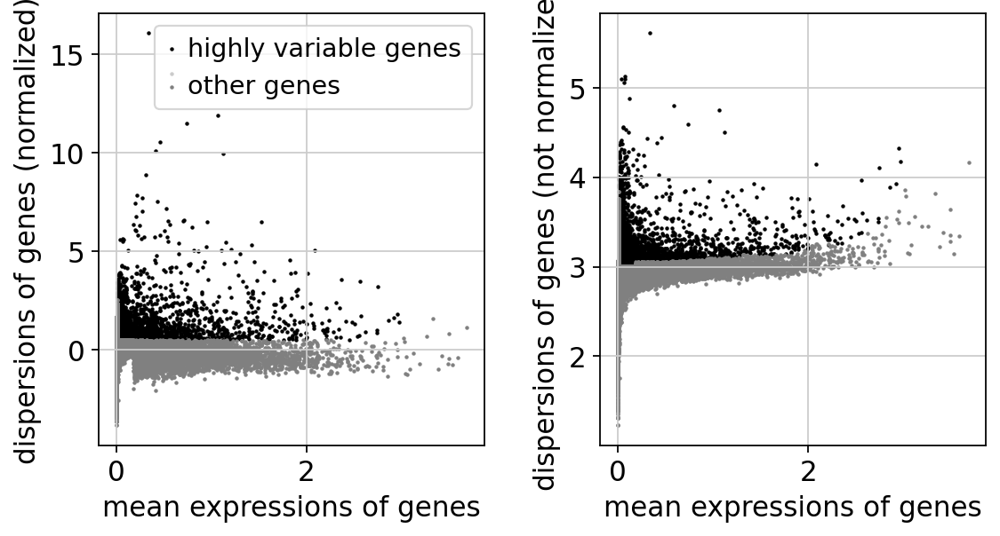

In [12]:
sc.pl.highly_variable_genes(adata)

In [13]:
adata.raw = adata

In [14]:
adata = adata[:, adata.var.highly_variable]

In [15]:
adata.var.highly_variable_baboon=[q & w for q,w in zip(adata.var.highly_variable, ["Papio_anubis" in i for i in adata.var.index])]

In [16]:
adata = adata[:, adata.var.highly_variable_baboon]

In [17]:
np.unique([i[0:10] for i in adata.var.index], return_counts=True)

(array(['Papio_anub'], dtype='<U10'), array([3241]))

In [18]:
#sc.pp.regress_out(adata, ['n_counts'])

In [19]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [24]:
adata

AnnData object with n_obs × n_vars = 3774 × 3241
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'log1p', 'hvg'

# Principal Components analysis

In [20]:
sc.tl.pca(adata, svd_solver="arpack")

computing PCA
    with n_comps=50
    finished (0:00:00)


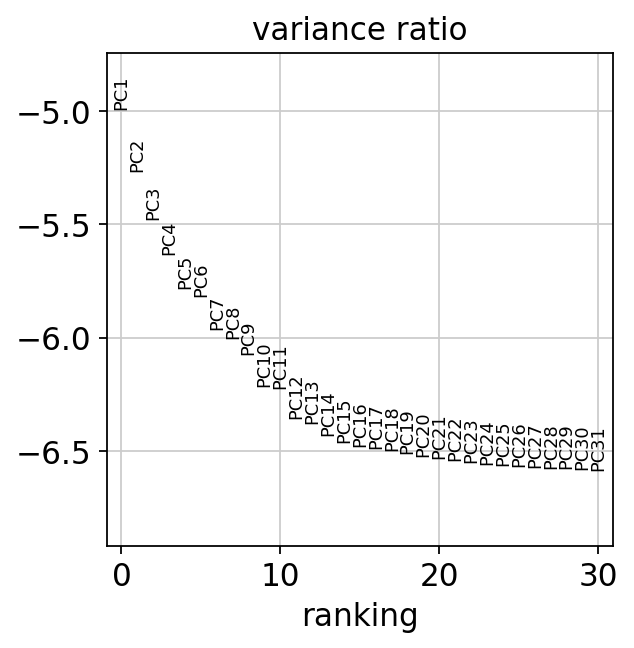

In [21]:
sc.pl.pca_variance_ratio(adata, log=True)

# harmony

In [22]:
adata

AnnData object with n_obs × n_vars = 3774 × 3241
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [23]:
um_pcs=23
pca=adata.obsm['X_pca']
meta_data=adata.obs
adata_harmony=adata.copy()

In [24]:
ho=hm.run_harmony(pca, meta_data, ['Sample_ID'],
                  epsilon_harmony=-float('Inf'), epsilon_cluster=-float('Inf'),
                  random_state=10)

2025-05-08 08:27:31,182 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-08 08:27:32,673 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-08 08:27:32,686 - harmonypy - INFO - Iteration 1 of 10
2025-05-08 08:27:33,348 - harmonypy - INFO - Iteration 2 of 10
2025-05-08 08:27:33,969 - harmonypy - INFO - Iteration 3 of 10
2025-05-08 08:27:34,588 - harmonypy - INFO - Iteration 4 of 10
2025-05-08 08:27:35,213 - harmonypy - INFO - Iteration 5 of 10
2025-05-08 08:27:35,833 - harmonypy - INFO - Iteration 6 of 10
2025-05-08 08:27:36,453 - harmonypy - INFO - Iteration 7 of 10
2025-05-08 08:27:37,073 - harmonypy - INFO - Iteration 8 of 10
2025-05-08 08:27:37,692 - harmonypy - INFO - Iteration 9 of 10
2025-05-08 08:27:38,308 - harmonypy - INFO - Iteration 10 of 10
2025-05-08 08:27:38,932 - harmonypy - INFO - Stopped before convergence


In [25]:
res=pd.DataFrame(ho.Z_corr)
res=res.T
adata.obsm['X_pca']=res.values

In [ ]:
# adata.write("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Lymphoids_NEW_harmony_preprocessed.h5ad")

In [32]:
adata

AnnData object with n_obs × n_vars = 3774 × 3241
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [5]:
um_pcs=23

In [6]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=um_pcs)

computing neighbors
    using 'X_pca' with n_pcs = 23


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [7]:
sc.tl.umap(adata, min_dist= 0.2,spread=0.5)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


# Final annotated object

In [29]:
# Annotated object

#adata.write("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/FINAL_Baboon_Lymphoids_Annotated_Without_RO.h5ad")

# Restart from here with annotated object

In [7]:
adata=sc.read_h5ad('/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/FINAL_Baboon_Lymphoids_Annotated_Without_RO.h5ad')

# General exploration of object/lymphoids

In [8]:
adata

AnnData object with n_obs × n_vars = 3774 × 3241
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints', 'leiden_06', 'leiden_12', 'leiden_10', 'leiden_07', 'leiden_01', 'leiden_named_07', 'leiden_named_10', 'leiden_named_12', 'leiden', 'leiden_08', 'leiden_named_08'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'hvg', 'leiden', 'leiden_01', 'leiden_01_colors', 'leiden_02', 'leiden_02_c

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


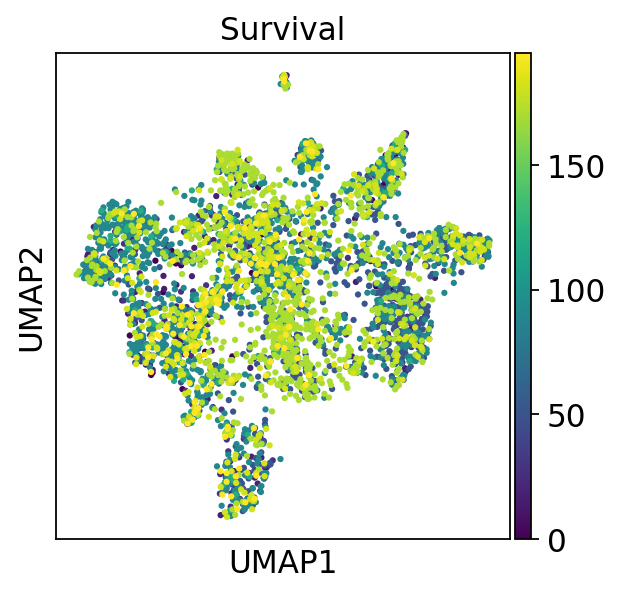

In [10]:
sc.tl.leiden(
    adata,
    resolution=0.8,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)
sc.pl.umap(adata, color=["Survival"])

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


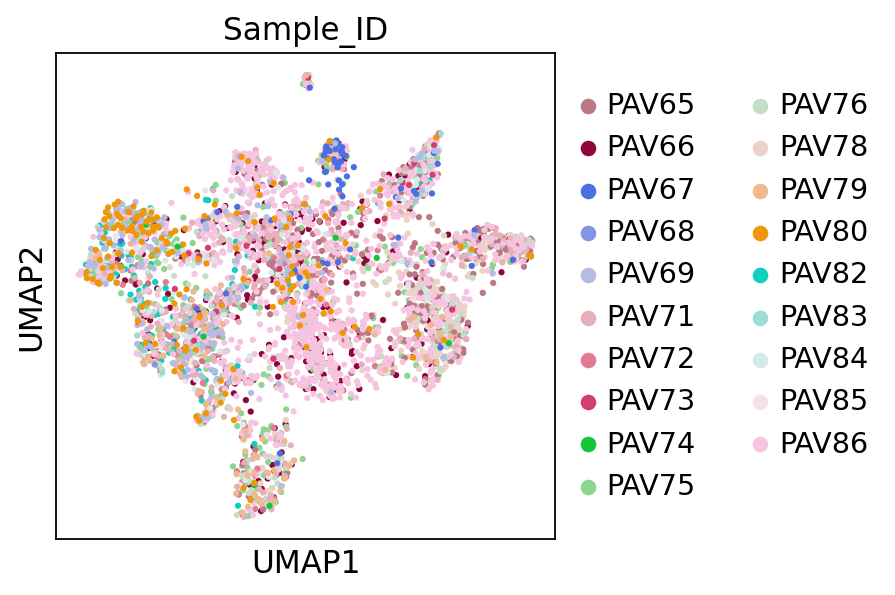

In [11]:
sc.tl.leiden(
    adata,
    resolution=0.8,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)
sc.pl.umap(adata, color=["Sample_ID"])

In [12]:
sc.settings.verbosity = 2  # reduce the verbosity

In [19]:
#sc.tl.rank_genes_groups(adata, "leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

# cell state annotation 

running Leiden clustering
    finished (0:00:00)


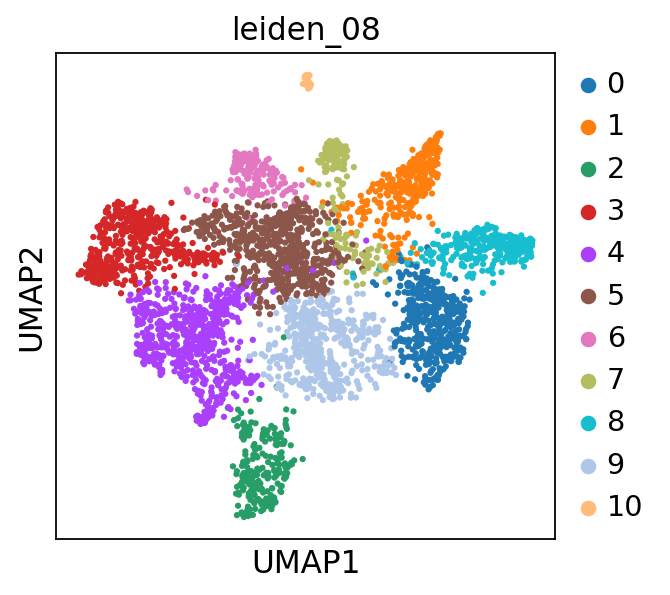

running Leiden clustering
    finished (0:00:00)


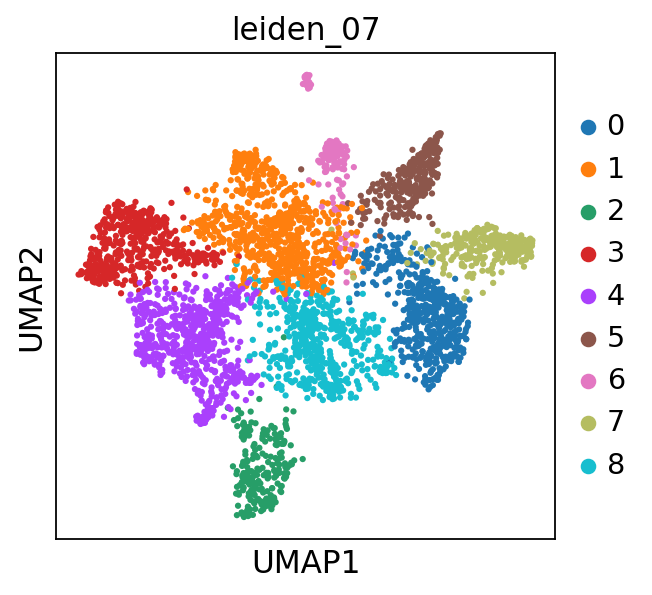

running Leiden clustering
    finished (0:00:00)


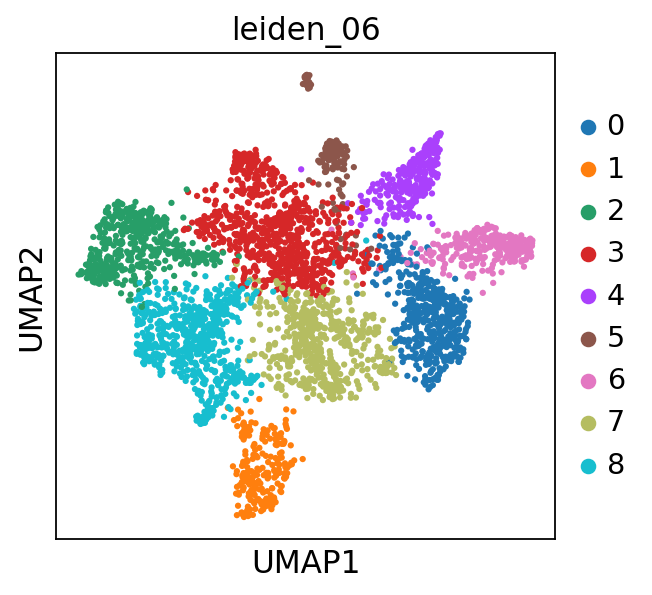

In [13]:
# Different leiden resolutions

#sc.tl.leiden(
#    adata,
#    resolution=1.2,
#    random_state=0,
#    flavor="igraph",
#    n_iterations=2,
#    directed=False,
#    key_added="leiden_12"
#)
#sc.pl.umap(adata, color=["leiden_12"])
#
#sc.tl.leiden(
#    adata,
#    resolution=1.0,
#    random_state=0,
#    flavor="igraph",
#    n_iterations=2,
#    directed=False,
#    key_added="leiden_10"
#)
#sc.pl.umap(adata, color=["leiden_10"])

sc.tl.leiden(
    adata,
    resolution=0.8,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_08"
)
sc.pl.umap(adata, color=["leiden_08"])

sc.tl.leiden(
    adata,
    resolution=0.7,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_07"
)
sc.pl.umap(adata, color=["leiden_07"])

sc.tl.leiden(
    adata,
    resolution=0.6,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
    key_added="leiden_06"
)
sc.pl.umap(adata, color=["leiden_06"])

#sc.tl.leiden(
#    adata,
#    resolution=0.2,
#    random_state=0,
#    flavor="igraph",
#    n_iterations=2,
#    directed=False,
#    key_added="leiden_02"
#)
#sc.pl.umap(adata, color=["leiden_02"])
#
#sc.tl.leiden(
#    adata,
#    resolution=0.1,
#    random_state=0,
#    flavor="igraph",
#    n_iterations=2,
#    directed=False,
#    key_added="leiden_01"
#)
#sc.pl.umap(adata, color=["leiden_01"])

In [22]:
#sc.tl.rank_genes_groups(adata, "leiden_07", method="wilcoxon")
#sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

In [23]:
## Find marker genes for the new clusters
#sc.tl.rank_genes_groups(adata, groupby='leiden_06', method='wilcoxon')
#
## Extract top marker genes for each cluster
#top_genes = 5  # Number of top marker genes to display for each cluster
#
## Extract the top marker genes for each cluster
#result = adata.uns['rank_genes_groups']
#groups = result['names'].dtype.names
#top_markers = []
#for group in groups:
#    top_markers.extend(result['names'][group][:top_genes])
#
## Create the dot plot
#sc.pl.dotplot(adata, var_names=top_markers, groupby='leiden_06')
#
#sc.pl.umap(adata, color=["leiden_06"])

ranking genes


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished (0:00:06)


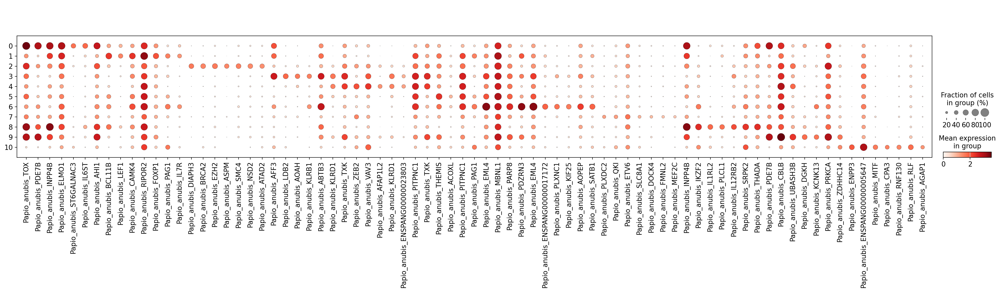

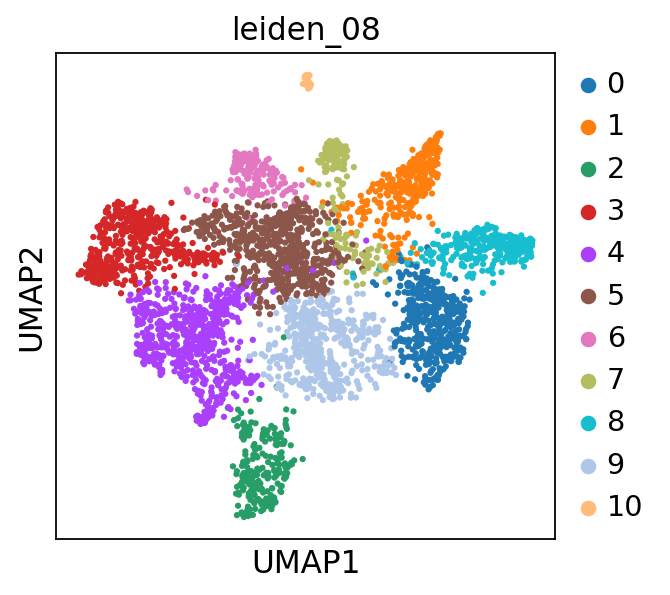

In [14]:
# Find marker genes for the new clusters
sc.tl.rank_genes_groups(adata, groupby='leiden_08', method='wilcoxon')

# Extract top marker genes for each cluster
top_genes = 7  # Number of top marker genes to display for each cluster

# Extract the top marker genes for each cluster
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
top_markers = []
for group in groups:
    top_markers.extend(result['names'][group][:top_genes])

# Create the dot plot
sc.pl.dotplot(adata, var_names=top_markers, groupby='leiden_08')

sc.pl.umap(adata, color=["leiden_08"])

# Final lymphoid annotation

In [6]:
#sc.pl.umap(adata, color=["leiden_08"])

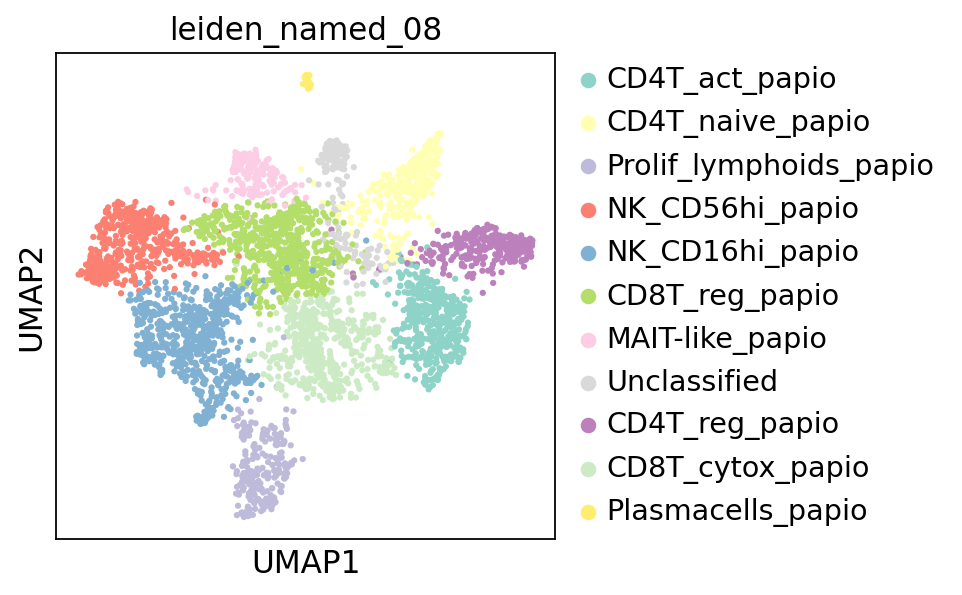

In [15]:
cluster_map = {
    "0": "CD4T_act_papio",
    "1": "CD4T_naive_papio",
    "2": "Prolif_lymphoids_papio",
    "3": "NK_CD56hi_papio",
    "4": "NK_CD16hi_papio",
    "5": "CD8T_reg_papio",
    "6": "MAIT-like_papio",
    "7": "Unclassified",
    "8": "CD4T_reg_papio",
    "9": "CD8T_cytox_papio",
    "10": "Plasmacells_papio"
    
}

# Create a new column with the renamed clusters
adata.obs["leiden_named_08"] = adata.obs["leiden_08"].map(cluster_map)

# Visualize the UMAP with the new cluster names
sc.pl.umap(adata, 
           color=["leiden_named_08"])          

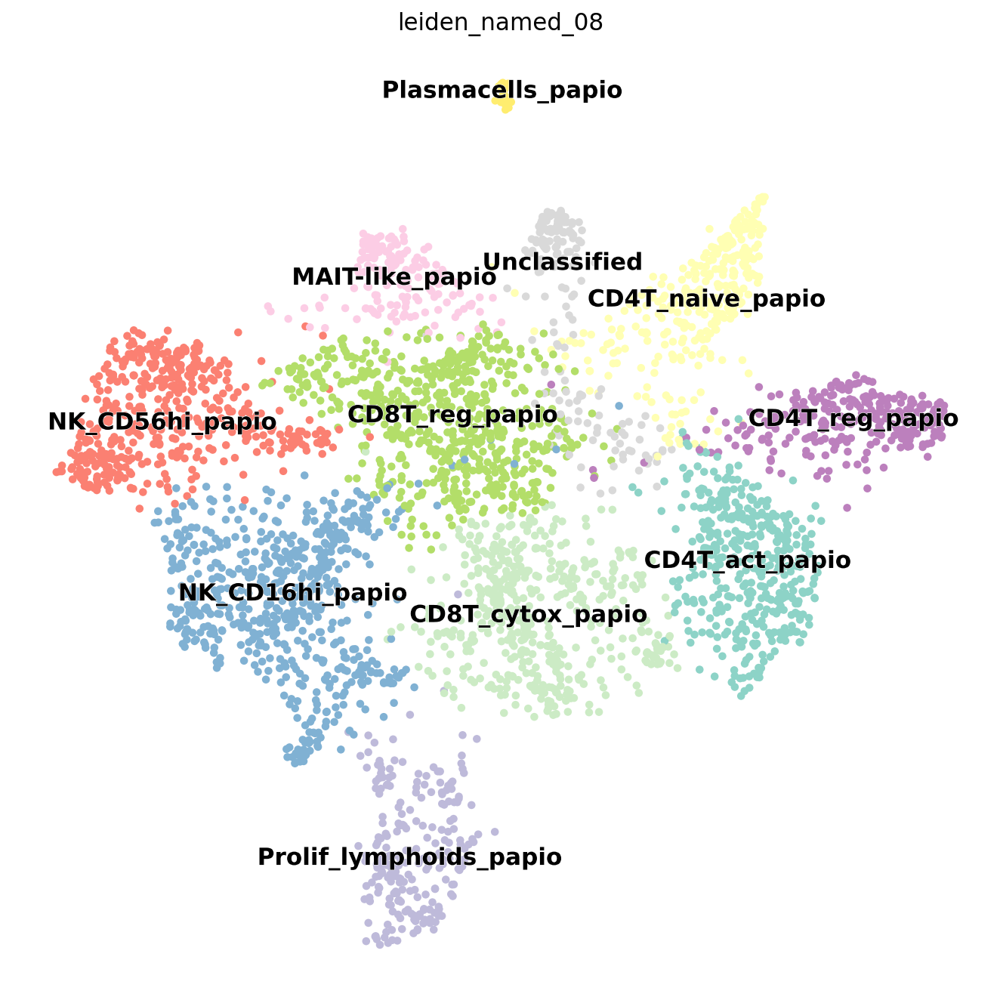

In [16]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set the figure size
fig, ax = plt.subplots(figsize=(8.5, 8.5))

# Call sc.pl.umap with the specified parameters
sc.pl.umap(adata, 
           color=["leiden_named_08"], 
           frameon=False, 
           legend_loc='on data', 
           legend_fontoutline=0.5,
           size=90,
           legend_fontsize=14,
           ax=ax,
           show=False)  # Use show=False to allow further modifications

# Add axis labels
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')

# Show tick labels
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


ranking genes
    finished (0:00:06)


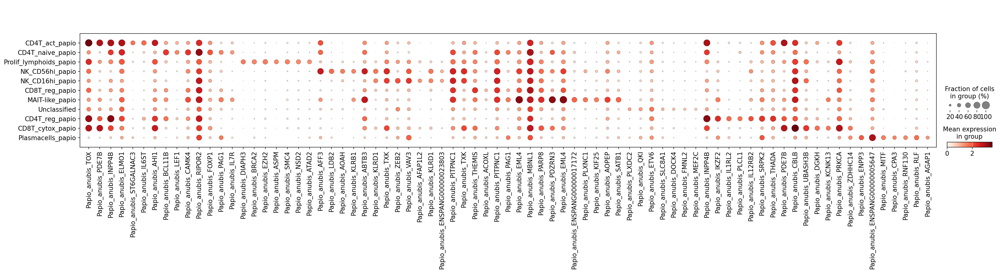

In [18]:
# Find marker genes for the new clusters
sc.tl.rank_genes_groups(adata, groupby='leiden_named_08', method='wilcoxon')

# Extract top marker genes for each cluster
top_genes = 7  # Number of top marker genes to display for each cluster

# Extract the top marker genes for each cluster
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
top_markers = []
for group in groups:
    top_markers.extend(result['names'][group][:top_genes])

# Create the dot plot
sc.pl.dotplot(adata, var_names=top_markers, groupby='leiden_named_08')

#sc.pl.umap(adata, color=["leiden_named_08"])

# Differential expressed genes (DEG) using wilcoxon combination with expression inside and outside of clusters (ei/eo)

# ei/eo START

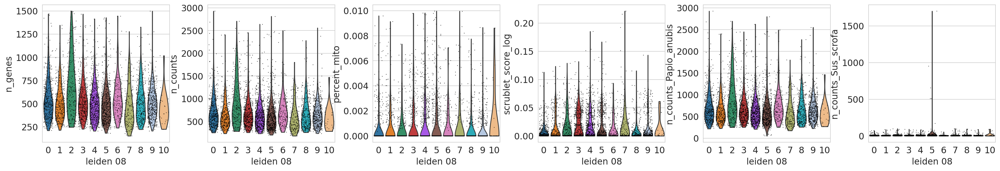

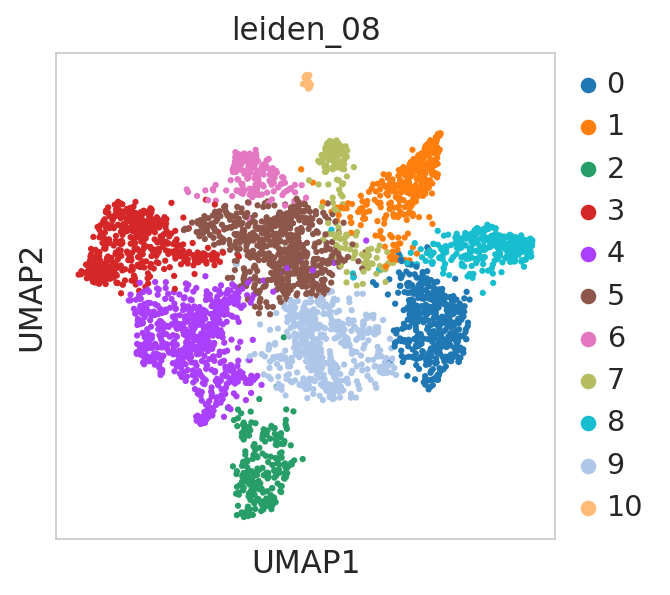

In [96]:
sc.pl.violin(
    adata,
    ["n_genes", "n_counts", "percent_mito", "scrublet_score_log", 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa'],
    groupby="leiden_08",
    jitter=0.4,
    multi_panel=True,
)

sc.pl.umap(adata, color=["leiden_08"])

In [98]:
from plotnine import *

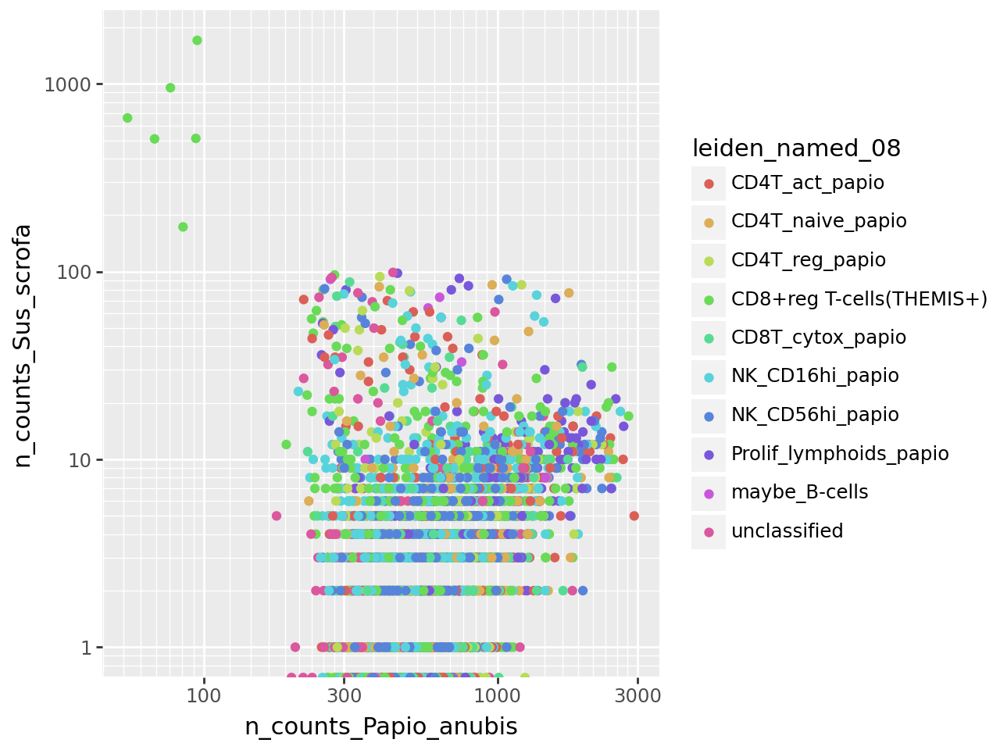

In [99]:
ggplot(aes(x=adata.obs['n_counts_Papio_anubis'],
           y=adata.obs['n_counts_Sus_scrofa'],
          color=adata.obs['leiden_named_08'])) + geom_point() + scale_x_log10() + scale_y_log10()

In [19]:
def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):
#adata_obj=fbs_new_harmony.copy()
#key='rank_genes_groups'
#DE_column='leiden'
    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    # Create a Adata raw with raw in .X -> We might remove this step - redundant!
    dummy=anndata.AnnData(X=adata_obj.raw.X,
                   var=adata_obj.raw.var,
                   obs=adata_obj.obs)
    # We split the adata by Cell-type. Genes are ordered according to ranks from DEgene analysis
    dummy_split=[dummy[dummy.obs[DE_column].isin([i]),
                  gene_names[i]] for i in gene_names.columns]
    dummy_split_adatasize=[i.shape[0] for i in dummy_split] # How many cells we have in-cluster
    dummy_outcluster=[dummy[~dummy.obs[DE_column].isin([i]),
                       gene_names[i]] for i in gene_names.columns]
    dummy_split_adatasize_outcluster=[i.shape[0] for i in dummy_outcluster] # How many cells we have in out-cluster
    for adata, sizeof_adata, adata_outcluster, sizeof_adata_outcluster in zip(dummy_split, dummy_split_adatasize, 
                                                     dummy_outcluster, dummy_split_adatasize_outcluster):
        cluster_number=[(adata.obs[DE_column].unique()).tolist()][0]
        #incluster_rows, incluster_cols=adata.X.nonzero()
        #https://stackoverflow.com/questions/3797158/counting-non-zero-elements-within-each-row-and-within-each-column-of-a-2d-numpy
        #incluster_counts = [len(np.where(incluster_cols==i)[0]) for i in range(0,adata.shape[1])]
        incluster_counts=np.diff(adata.X.tocsc().indptr)
        percent_expression_incluster=np.array(incluster_counts)/sizeof_adata 
        fraction_in_cluster_matrix[cluster_number[0]]=percent_expression_incluster
        #outcluster_rows, outcluster_cols=adata_outcluster.X.nonzero()
        #outcluster_counts = [len(np.where(outcluster_cols==i)[0]) for i in range(0,adata_outcluster.shape[1])]
        outcluster_counts=np.diff(adata_outcluster.X.tocsc().indptr)
        percent_expression_outcluster=np.array(outcluster_counts)/sizeof_adata_outcluster 
        fraction_notin_cluster_matrix[cluster_number[0]]=percent_expression_outcluster
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number[0]]=np.squeeze(np.asarray(adata.X.mean(axis=0)))
        allnotin_cluster_matrix[cluster_number[0]]=np.squeeze(np.asarray(adata_outcluster.X.mean(axis=0)))
    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pi'] = to_tensor(fraction_in_cluster_matrix)
    result['po'] = to_tensor(fraction_notin_cluster_matrix)
    result['ei'] = to_tensor(allin_cluster_expr_matrix)
    result['eo'] = to_tensor(allnotin_cluster_matrix)
    results =pd.DataFrame(
        {group + '_' + key[:2]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pi', 'po', "ei", "eo"]})


In [20]:
sc.tl.rank_genes_groups(adata, groupby='leiden_named_08', method='wilcoxon')

ranking genes
    finished (0:00:06)


In [21]:
df=filter_by_expression(adata, 'leiden_named_08', key='rank_genes_groups')

In [28]:
def makevector_topmarkers(adata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30, expression_in=1, expression_out=0.5): 
    results=adata.uns['rank_genes_groups']
    clusters = results['names'].dtype.names
    top_genes=[]
    for cluster in clusters:
        topgenes_cluster=results['names'][cluster][np.where((results['logfoldchanges'][cluster]>=ldFC_cutoff) & 
                                                            (results['pvals_adj'][cluster]<(pvals_adj_cutoff)) &
                                                           (results['ei'][cluster]>=expression_in) & 
                                                            (results['eo'][cluster]<=expression_out)
                                                           )][0:top_n]
        top_genes.extend(topgenes_cluster)
    return(top_genes)

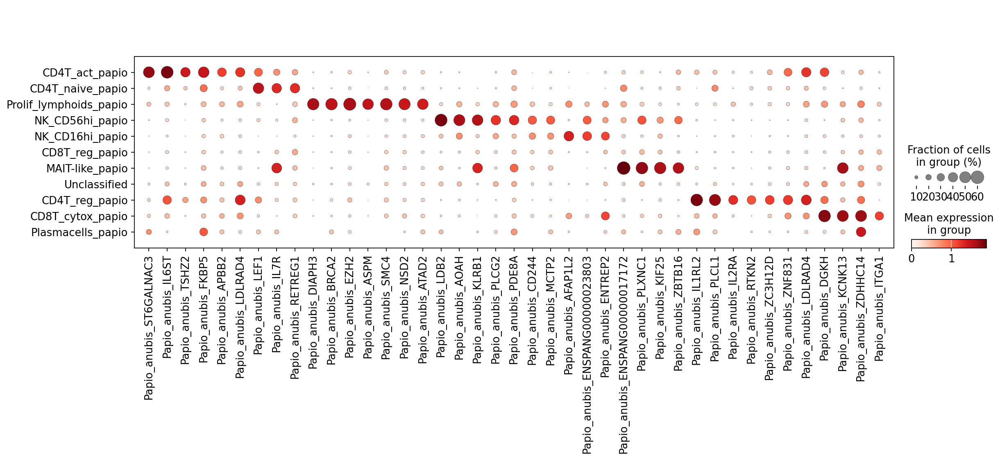

In [29]:
sc.pl.dotplot(adata,
              var_names=makevector_topmarkers(adata, 7, 
                                            ldFC_cutoff=0.5, 
                                            pvals_adj_cutoff=1e-10,
                                            expression_in=1,
                                             expression_out=0.5),
              groupby="leiden_named_08")

# ei/eo END 

# Annotation of Lymphoids - see gene set notebook

# Classical Lymphoid markers

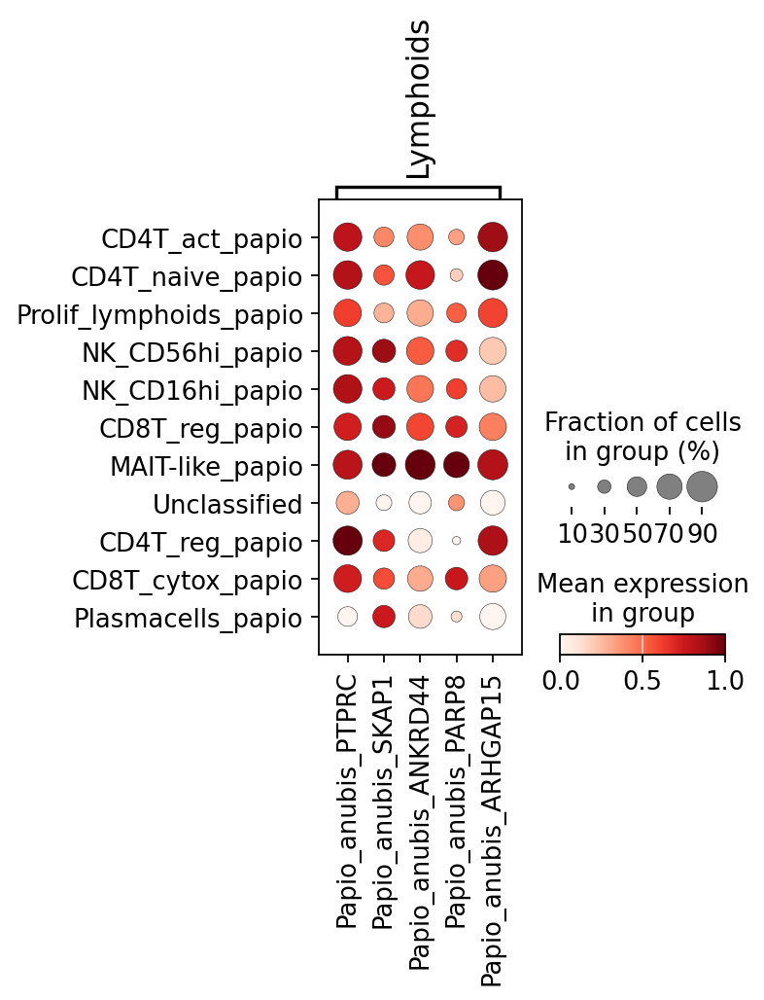

In [30]:
# are all lymphoids lymphoids?
marker_genes={ 'Lymphoids': ["Papio_anubis_PTPRC", "Papio_anubis_SKAP1", "Papio_anubis_ANKRD44", "Papio_anubis_PARP8", "Papio_anubis_ARHGAP15"]}
cell_types = ['Lymphoids']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}


sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

# Cluster 7: no lymphoid marker genes -> likely dentric cells

# Cell type annotation according to Heart Atlas Paper

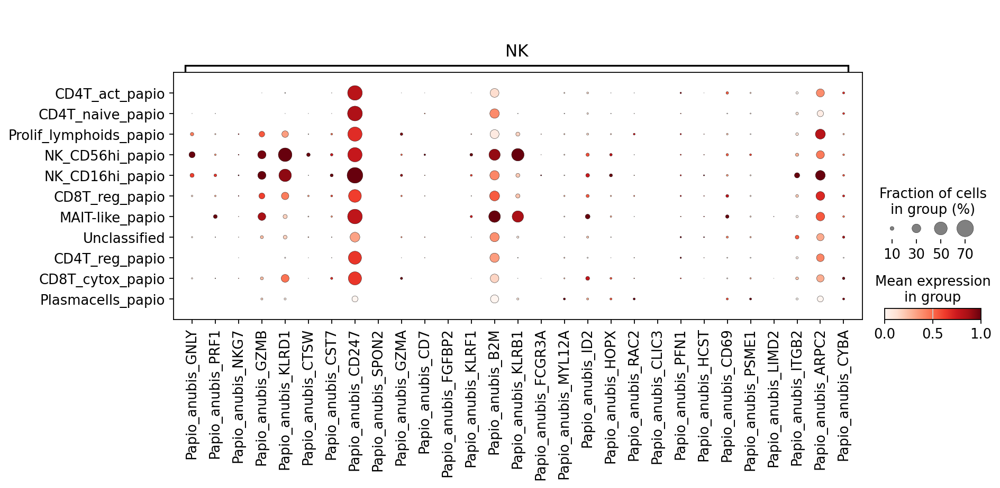

In [36]:
# NK
marker_genes={ 'NK': ["Papio_anubis_GNLY", "Papio_anubis_PRF1", "Papio_anubis_NKG7", "Papio_anubis_GZMB", "Papio_anubis_KLRD1", "Papio_anubis_CTSW", "Papio_anubis_CST7", "Papio_anubis_CD247", "Papio_anubis_SPON2", "Papio_anubis_GZMA", "Papio_anubis_CD7", "Papio_anubis_FGFBP2", "Papio_anubis_KLRF1", "Papio_anubis_B2M", "Papio_anubis_KLRB1", "Papio_anubis_FCGR3A", "Papio_anubis_MYL12A", "Papio_anubis_ID2", "Papio_anubis_HOPX", "Papio_anubis_RAC2", "Papio_anubis_CLIC3", "Papio_anubis_PFN1", "Papio_anubis_HCST", "Papio_anubis_CD69", "Papio_anubis_PSME1", "Papio_anubis_LIMD2", "Papio_anubis_ITGB2", "Papio_anubis_ARPC2", "Papio_anubis_CYBA"
                     ]}
cell_types = ['B-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



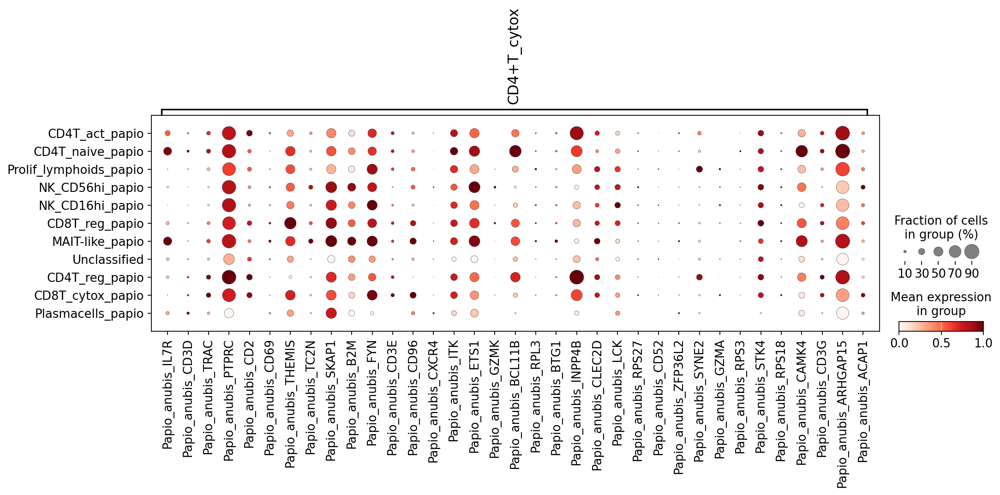

In [37]:
# CD4+T_cytox
marker_genes={ 'CD4+T_cytox': ["Papio_anubis_IL7R", "Papio_anubis_CD3D", "Papio_anubis_TRAC", "Papio_anubis_PTPRC", "Papio_anubis_CD2", "Papio_anubis_CD69", "Papio_anubis_THEMIS", "Papio_anubis_TC2N", "Papio_anubis_SKAP1", "Papio_anubis_B2M", "Papio_anubis_FYN", "Papio_anubis_CD3E", "Papio_anubis_CD96", "Papio_anubis_CXCR4", "Papio_anubis_ITK", "Papio_anubis_ETS1", "Papio_anubis_GZMK", "Papio_anubis_BCL11B", "Papio_anubis_RPL3", "Papio_anubis_BTG1", "Papio_anubis_INPP4B", "Papio_anubis_CLEC2D", "Papio_anubis_LCK", "Papio_anubis_RPS27", "Papio_anubis_CD52", "Papio_anubis_ZFP36L2", "Papio_anubis_SYNE2", "Papio_anubis_GZMA", "Papio_anubis_RPS3", "Papio_anubis_STK4", "Papio_anubis_RPS18", "Papio_anubis_CAMK4", "Papio_anubis_CD3G", "Papio_anubis_ARHGAP15", "Papio_anubis_ACAP1"
                              ]}
cell_types = ['CD4+T_cytox']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



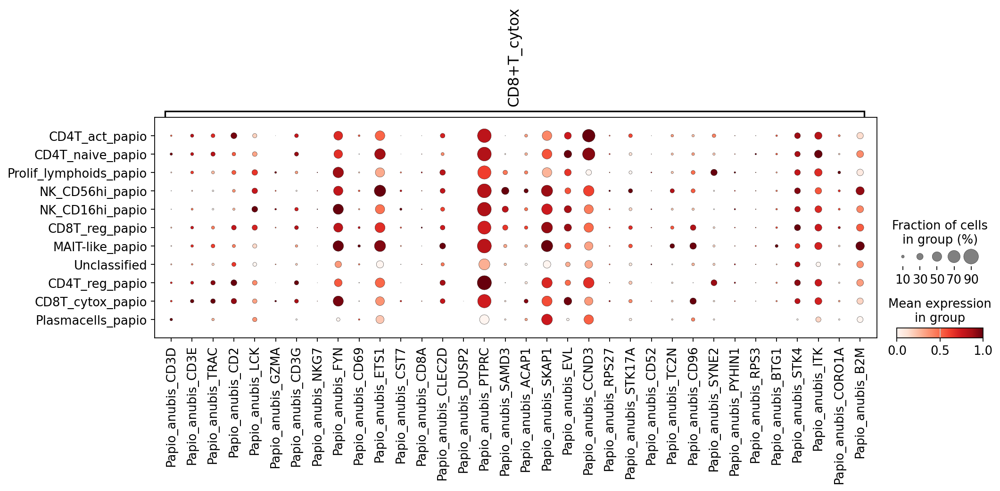

In [38]:
# CD8+T_cytox
marker_genes={ 'CD8+T_cytox': ["Papio_anubis_CD3D","Papio_anubis_CD3E","Papio_anubis_TRAC","Papio_anubis_CD2","Papio_anubis_LCK","Papio_anubis_GZMA","Papio_anubis_CD3G","Papio_anubis_NKG7","Papio_anubis_FYN","Papio_anubis_CD69","Papio_anubis_ETS1","Papio_anubis_CST7","Papio_anubis_CD8A","Papio_anubis_CLEC2D","Papio_anubis_DUSP2","Papio_anubis_PTPRC","Papio_anubis_SAMD3","Papio_anubis_ACAP1","Papio_anubis_SKAP1","Papio_anubis_EVL","Papio_anubis_CCND3","Papio_anubis_RPS27","Papio_anubis_STK17A","Papio_anubis_CD52","Papio_anubis_TC2N","Papio_anubis_CD96","Papio_anubis_SYNE2","Papio_anubis_PYHIN1","Papio_anubis_RPS3","Papio_anubis_BTG1","Papio_anubis_STK4","Papio_anubis_ITK","Papio_anubis_CORO1A","Papio_anubis_B2M"
]}
cell_types = ['CD8+T_cytox']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



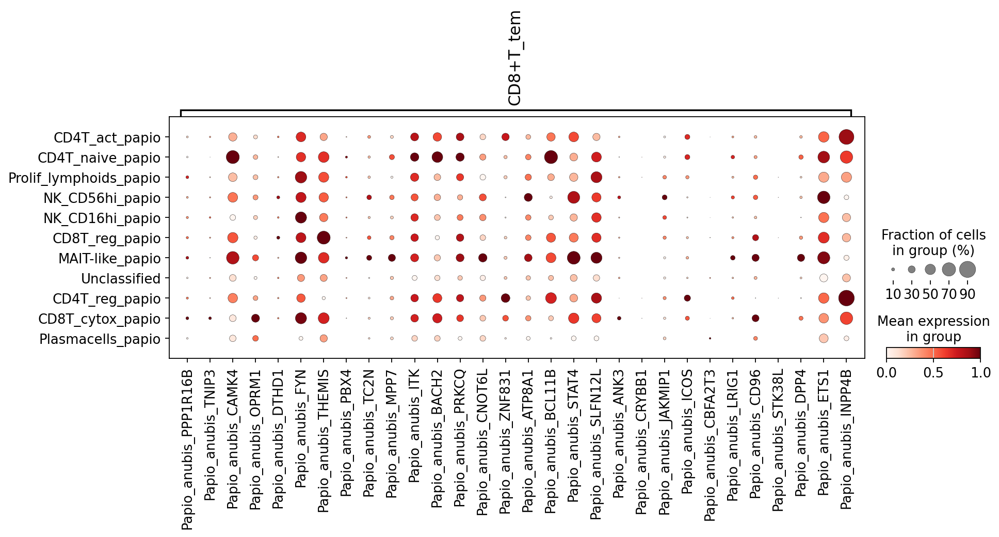

In [39]:
# CD8+T_tem
marker_genes={ 'CD8+T_tem': ["Papio_anubis_PPP1R16B","Papio_anubis_TNIP3","Papio_anubis_CAMK4","Papio_anubis_OPRM1","Papio_anubis_DTHD1","Papio_anubis_FYN","Papio_anubis_THEMIS","Papio_anubis_PBX4","Papio_anubis_TC2N","Papio_anubis_MPP7","Papio_anubis_ITK","Papio_anubis_BACH2","Papio_anubis_PRKCQ","Papio_anubis_CNOT6L","Papio_anubis_ZNF831","Papio_anubis_ATP8A1","Papio_anubis_BCL11B","Papio_anubis_STAT4","Papio_anubis_SLFN12L","Papio_anubis_ANK3","Papio_anubis_CRYBB1","Papio_anubis_JAKMIP1","Papio_anubis_ICOS","Papio_anubis_CBFA2T3","Papio_anubis_LRIG1","Papio_anubis_CD96","Papio_anubis_STK38L","Papio_anubis_DPP4","Papio_anubis_ETS1","Papio_anubis_INPP4B"
                            ]}
cell_types = ['CD8+T_tem']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



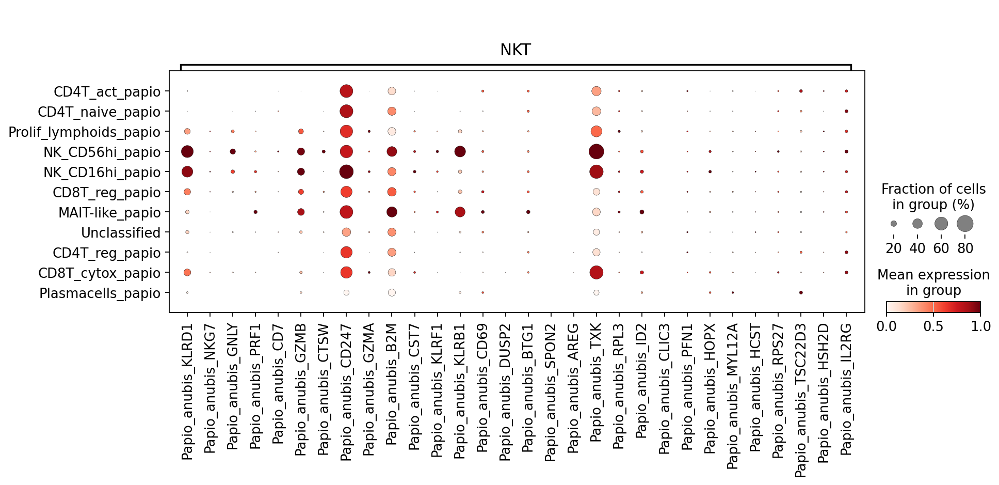

In [40]:
# NKT
marker_genes={ 'NKT': ["Papio_anubis_KLRD1","Papio_anubis_NKG7","Papio_anubis_GNLY","Papio_anubis_PRF1","Papio_anubis_CD7","Papio_anubis_GZMB","Papio_anubis_CTSW","Papio_anubis_CD247","Papio_anubis_GZMA","Papio_anubis_B2M","Papio_anubis_CST7","Papio_anubis_KLRF1","Papio_anubis_KLRB1","Papio_anubis_CD69","Papio_anubis_DUSP2","Papio_anubis_BTG1","Papio_anubis_SPON2","Papio_anubis_AREG","Papio_anubis_TXK","Papio_anubis_RPL3","Papio_anubis_ID2","Papio_anubis_CLIC3","Papio_anubis_PFN1","Papio_anubis_HOPX","Papio_anubis_MYL12A","Papio_anubis_HCST","Papio_anubis_RPS27","Papio_anubis_TSC22D3","Papio_anubis_HSH2D","Papio_anubis_IL2RG"

                      ]}
cell_types = ['NKT']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



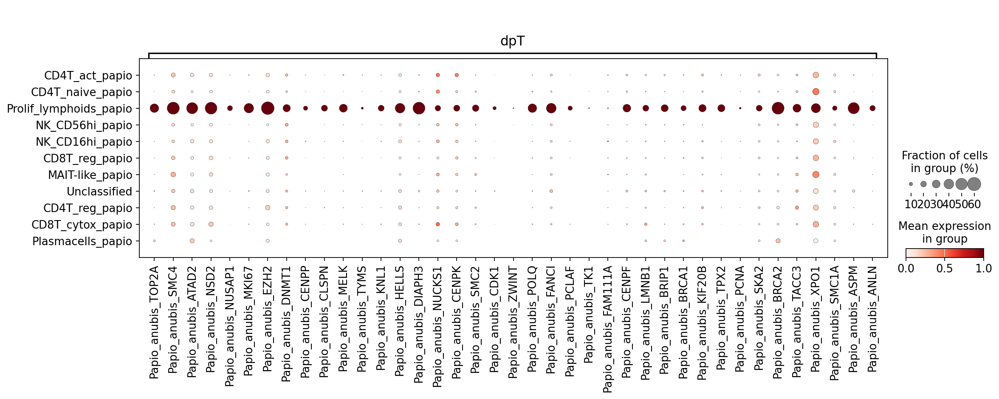

In [41]:
# dpT
marker_genes={ 'dpT': ["Papio_anubis_TOP2A","Papio_anubis_SMC4","Papio_anubis_ATAD2","Papio_anubis_NSD2","Papio_anubis_NUSAP1","Papio_anubis_MKI67","Papio_anubis_EZH2","Papio_anubis_DNMT1","Papio_anubis_CENPP","Papio_anubis_CLSPN","Papio_anubis_MELK","Papio_anubis_TYMS","Papio_anubis_KNL1","Papio_anubis_HELLS","Papio_anubis_DIAPH3","Papio_anubis_NUCKS1","Papio_anubis_CENPK","Papio_anubis_SMC2","Papio_anubis_CDK1","Papio_anubis_ZWINT","Papio_anubis_POLQ","Papio_anubis_FANCI","Papio_anubis_PCLAF","Papio_anubis_TK1","Papio_anubis_FAM111A","Papio_anubis_CENPF","Papio_anubis_LMNB1","Papio_anubis_BRIP1","Papio_anubis_BRCA1","Papio_anubis_KIF20B","Papio_anubis_TPX2","Papio_anubis_PCNA","Papio_anubis_SKA2","Papio_anubis_BRCA2","Papio_anubis_TACC3","Papio_anubis_XPO1","Papio_anubis_SMC1A","Papio_anubis_ASPM","Papio_anubis_ANLN"
 ]}
cell_types = ['dpT']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



# Cell type annotation according to DCM Paper

# B-cell/Plasma

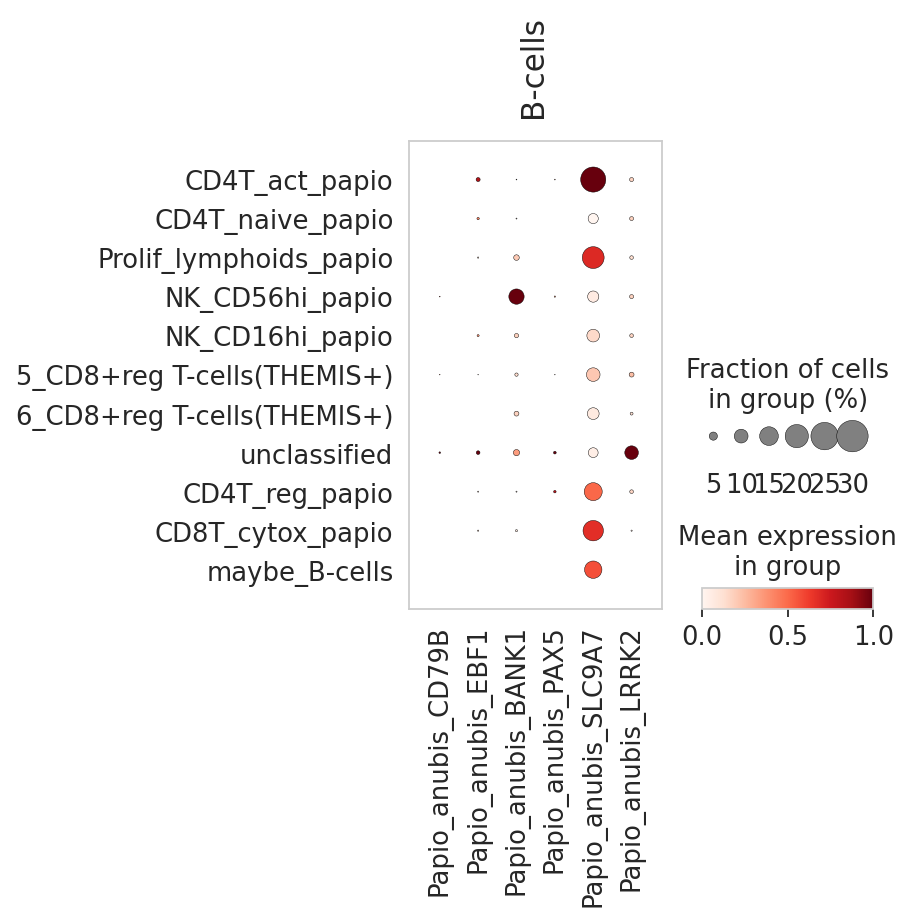

In [172]:
# general B-cell from Nastaran
marker_genes={ 'B-cells': ["Papio_anubis_CD79B", "Papio_anubis_EBF1", "Papio_anubis_BANK1", "Papio_anubis_PAX5", "Papio_anubis_SLC9A7", "Papio_anubis_LRRK2"
                          ]}
cell_types = ['B-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

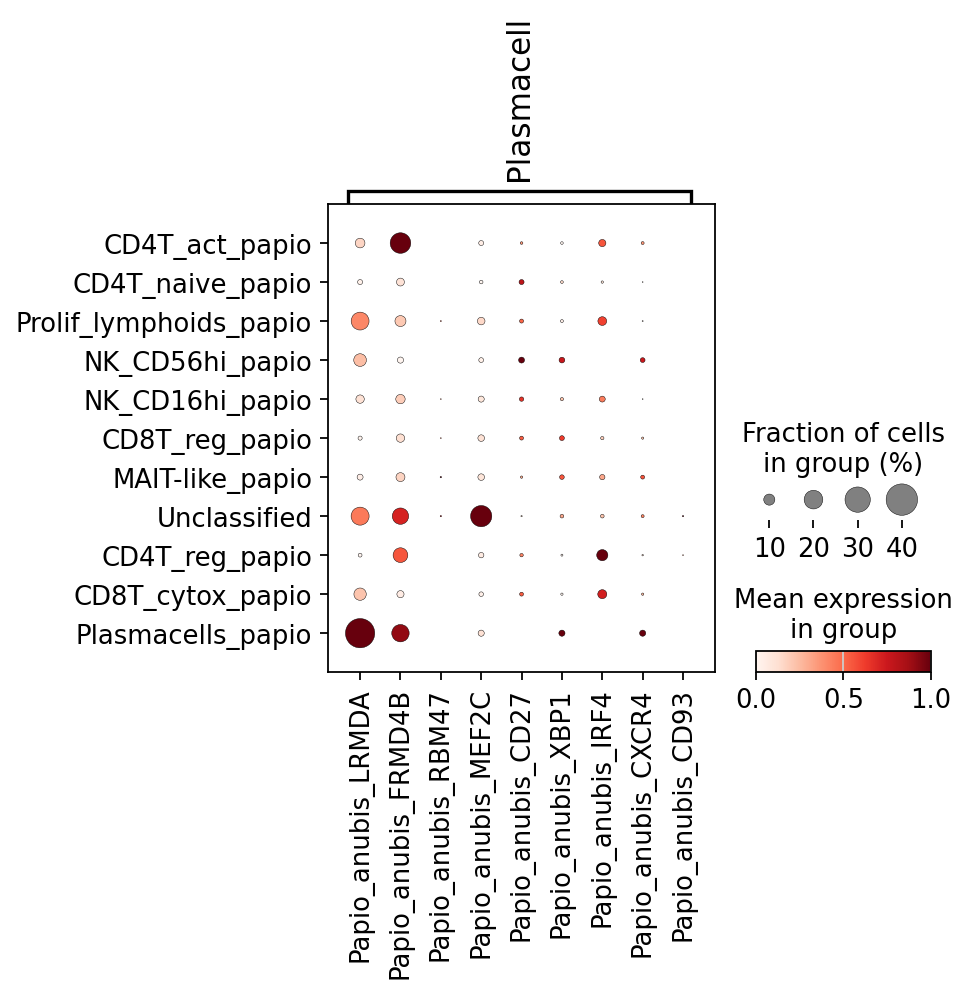

In [31]:
# general PLasmaCells from Nastaran

marker_genes={ 'Plasmacell': ["Papio_anubis_LRMDA", "Papio_anubis_FRMD4B", "Papio_anubis_RBM47", "Papio_anubis_MEF2C", "Papio_anubis_CD27", "Papio_anubis_XBP1","Papio_anubis_IRF4", "Papio_anubis_CXCR4", "Papio_anubis_CD93"                           
                          ]}
cell_types = ['Plasmacell']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

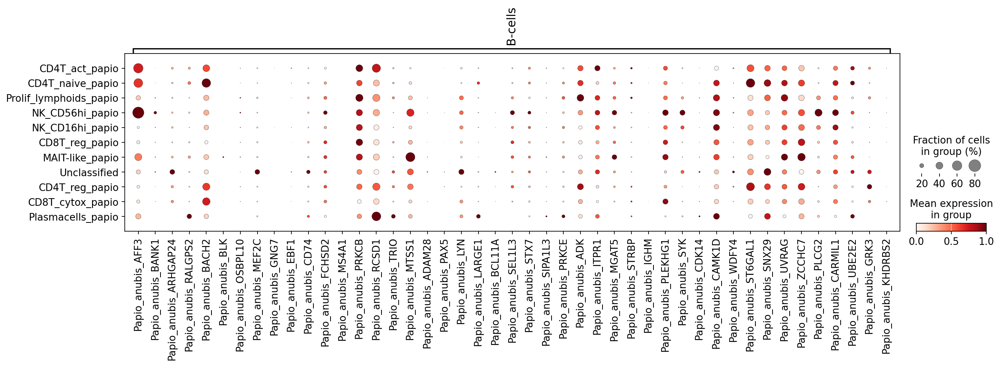

In [32]:
# B_cells
marker_genes={ 'B-cells': ["Papio_anubis_AFF3", "Papio_anubis_BANK1", "Papio_anubis_ARHGAP24", "Papio_anubis_RALGPS2", "Papio_anubis_BACH2", "Papio_anubis_BLK", "Papio_anubis_OSBPL10", "Papio_anubis_MEF2C", "Papio_anubis_GNG7", "Papio_anubis_EBF1", "Papio_anubis_CD74", "Papio_anubis_FCHSD2", "Papio_anubis_MS4A1", "Papio_anubis_PRKCB", "Papio_anubis_RCSD1", "Papio_anubis_TRIO", "Papio_anubis_MTSS1", "Papio_anubis_ADAM28", "Papio_anubis_PAX5", "Papio_anubis_LYN", "Papio_anubis_LARGE1", "Papio_anubis_BCL11A", "Papio_anubis_SEL1L3", "Papio_anubis_STX7", "Papio_anubis_SIPA1L3", "Papio_anubis_PRKCE", "Papio_anubis_ADK", "Papio_anubis_ITPR1", "Papio_anubis_MGAT5", "Papio_anubis_STRBP", "Papio_anubis_IGHM", "Papio_anubis_PLEKHG1", "Papio_anubis_SYK", "Papio_anubis_CDK14", "Papio_anubis_CAMK1D", "Papio_anubis_WDFY4", "Papio_anubis_ST6GAL1", "Papio_anubis_SNX29", "Papio_anubis_UVRAG", "Papio_anubis_ZCCHC7", "Papio_anubis_PLCG2", "Papio_anubis_CARMIL1", "Papio_anubis_UBE2E2", "Papio_anubis_GRK3", "Papio_anubis_KHDRBS2"
]}
cell_types = ['B-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

## Could not find keys '['Papio_anubis_IGHA1', 'Papio_anubis_IGHG1']
#
#marker_genes={ 'B-cells': ["Papio_anubis_AFF3", "Papio_anubis_BANK1", "Papio_anubis_ARHGAP24", "Papio_anubis_RALGPS2", "Papio_anubis_BACH2", "Papio_anubis_BLK", "Papio_anubis_OSBPL10", "Papio_anubis_MEF2C", "Papio_anubis_GNG7", "Papio_anubis_EBF1", "Papio_anubis_CD74", "Papio_anubis_FCHSD2", "Papio_anubis_MS4A1", "Papio_anubis_PRKCB", "Papio_anubis_RCSD1", "Papio_anubis_TRIO", "Papio_anubis_MTSS1", "Papio_anubis_ADAM28", "Papio_anubis_PAX5", "Papio_anubis_LYN", "Papio_anubis_LARGE1", "Papio_anubis_BCL11A", "Papio_anubis_SEL1L3", "Papio_anubis_STX7", "Papio_anubis_SIPA1L3", "Papio_anubis_PRKCE", "Papio_anubis_ADK", "Papio_anubis_ITPR1", "Papio_anubis_MGAT5", "Papio_anubis_STRBP", "Papio_anubis_IGHM", "Papio_anubis_PLEKHG1", "Papio_anubis_SYK", "Papio_anubis_CDK14", "Papio_anubis_CAMK1D", "Papio_anubis_WDFY4", "Papio_anubis_ST6GAL1", "Papio_anubis_SNX29", "Papio_anubis_UVRAG", "Papio_anubis_ZCCHC7", "Papio_anubis_PLCG2", "Papio_anubis_CARMIL1", "Papio_anubis_UBE2E2", "Papio_anubis_GRK3", "Papio_anubis_KHDRBS2"
#]}
#cell_types = ['B-cells']
#
#gene_markers = {
#    ct: [m for m in ct_markers if m in adata.var.index]
#    for ct, ct_markers in marker_genes.items()
#    if ct in cell_types
#}
#
#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#
#)





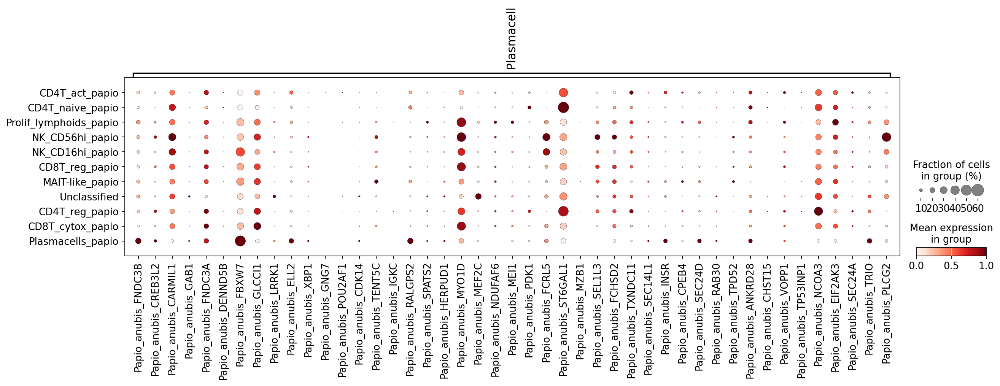

In [33]:
# Plasmacells
marker_genes={ 'Plasmacell': ["Papio_anubis_FNDC3B", "Papio_anubis_CREB3L2", "Papio_anubis_CARMIL1", "Papio_anubis_GAB1", "Papio_anubis_FNDC3A", "Papio_anubis_DENND5B", "Papio_anubis_FBXW7", "Papio_anubis_GLCCI1", "Papio_anubis_LRRK1", "Papio_anubis_ELL2", "Papio_anubis_XBP1", "Papio_anubis_GNG7", "Papio_anubis_POU2AF1", "Papio_anubis_CDK14", "Papio_anubis_TENT5C", "Papio_anubis_IGKC", "Papio_anubis_RALGPS2", "Papio_anubis_SPATS2", "Papio_anubis_HERPUD1", "Papio_anubis_MYO1D", "Papio_anubis_MEF2C", "Papio_anubis_NDUFAF6", "Papio_anubis_MEI1", "Papio_anubis_PDK1", "Papio_anubis_FCRL5", "Papio_anubis_ST6GAL1", "Papio_anubis_MZB1", "Papio_anubis_SEL1L3", "Papio_anubis_FCHSD2", "Papio_anubis_TXNDC11", "Papio_anubis_SEC14L1", "Papio_anubis_INSR", "Papio_anubis_CPEB4", "Papio_anubis_SEC24D", "Papio_anubis_RAB30", "Papio_anubis_TPD52", "Papio_anubis_ANKRD28", "Papio_anubis_CHST15", "Papio_anubis_VOPP1", "Papio_anubis_TP53INP1", "Papio_anubis_NCOA3", "Papio_anubis_EIF2AK3", "Papio_anubis_SEC24A", "Papio_anubis_TRIO", "Papio_anubis_PLCG2"
]}
cell_types = ['Plasmacell']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# Could not find keys '['Papio_anubis_IGHA1', 'Papio_anubis_IGHG1']

# Basic T-cell marker genes AND CD4 and CD8

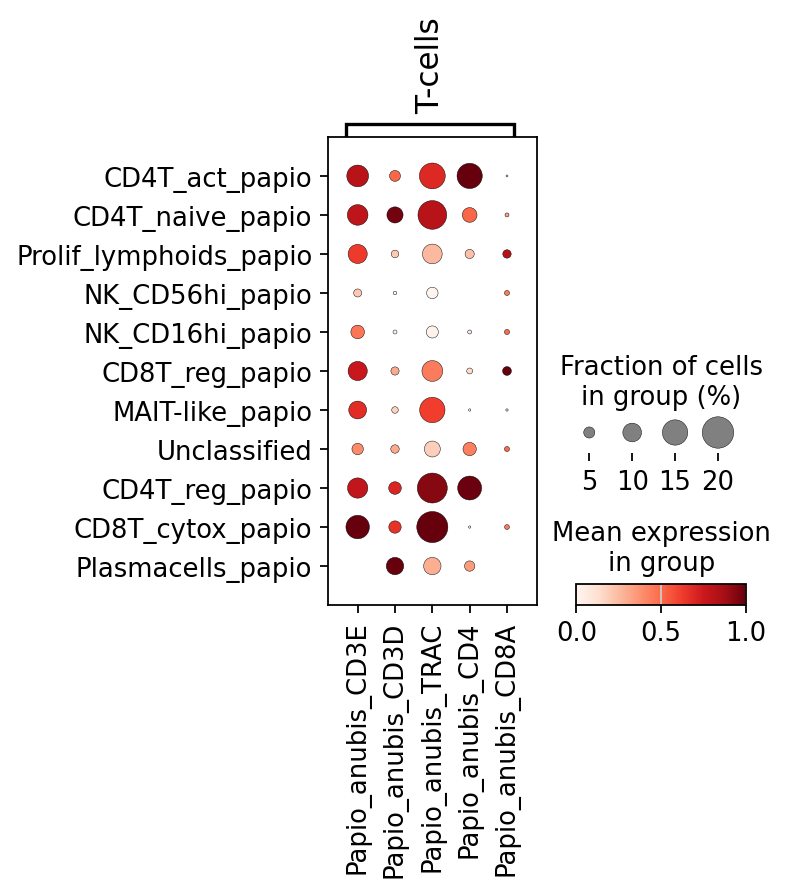

In [46]:
# T_cell marker genes
marker_genes={ 'T-cells': ["Papio_anubis_CD3E", "Papio_anubis_CD3D", "Papio_anubis_TRAC", "Papio_anubis_CD4", "Papio_anubis_CD8A"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

# "Could not find keys '['Papio_anubis_CD8B', 'Papio_anubis_CD8']

## T_cell marker genes
#marker_genes={ 'T-cells': ["Papio_anubis_CD3E", "Papio_anubis_CD3D", "Papio_anubis_TRAC", "Papio_anubis_CD4", "Papio_anubis_CD8A"]}
#cell_types = ['T-cells']
#
#gene_markers = {
#    ct: [m for m in ct_markers if m in adata.var.index]
#    for ct, ct_markers in marker_genes.items()
#    if ct in cell_types
#}
#
#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

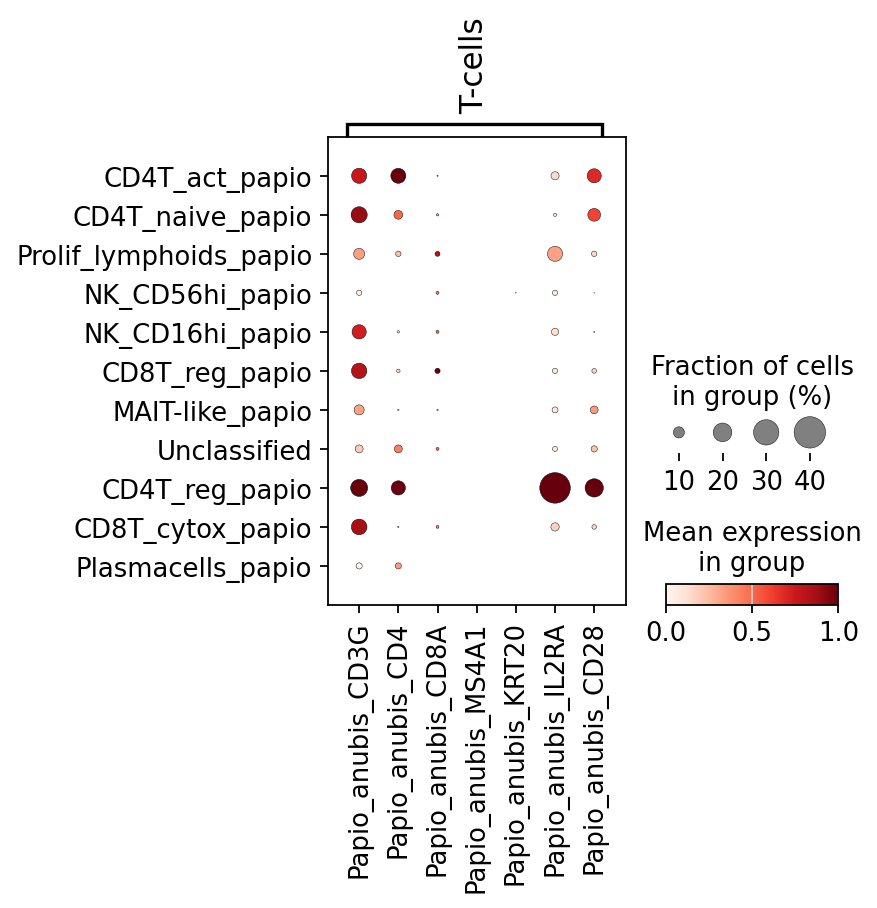

In [47]:
# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_CD3G","Papio_anubis_CD4", "Papio_anubis_CD8A", "Papio_anubis_MS4A1", "Papio_anubis_KRT20", "Papio_anubis_IL2RA", "Papio_anubis_CD28"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

## "Could not find keys '['Papio_anubis_CD8B', 'Papio_anubis_CD8'] //// MS4A1+KRT20 entspricht CD20 //// IL2RA entspricht CD25
#
## T_cells: CD4+ or CD8+
#marker_genes={ 'T-cells': ["Papio_anubis_CD3G","Papio_anubis_CD4", "Papio_anubis_CD8A", "Papio_anubis_MS4A1", "Papio_anubis_KRT20", "Papio_anubis_IL2RA", "Papio_anubis_CD28"]}
#cell_types = ['T-cells']
#
#gene_markers = {
#    ct: [m for m in ct_markers if m in adata.var.index]
#    for ct, ct_markers in marker_genes.items()
#    if ct in cell_types
#}
#
#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07"
#,
#    var_names=marker_genes,
#    standard_scale="var"  
#)

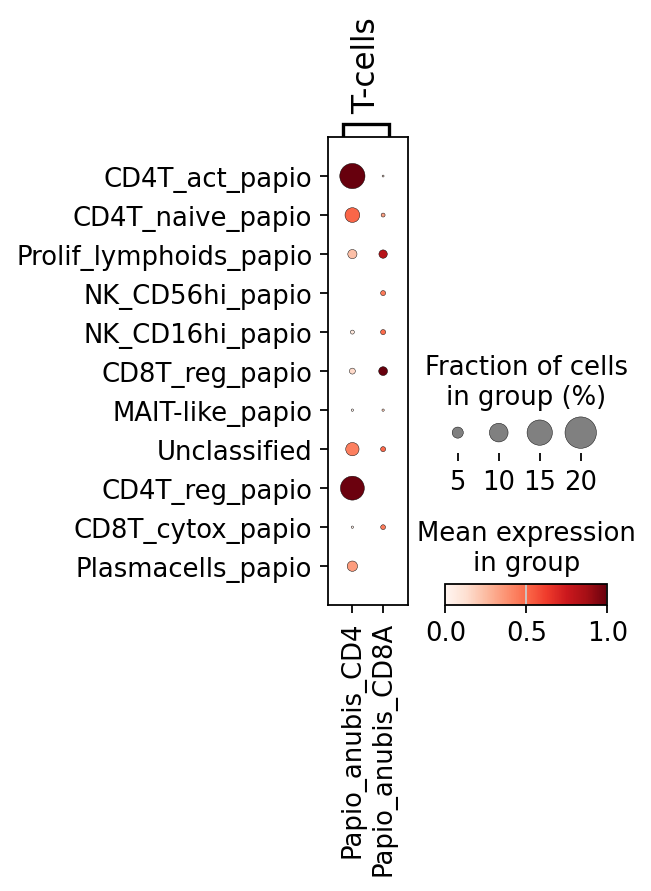

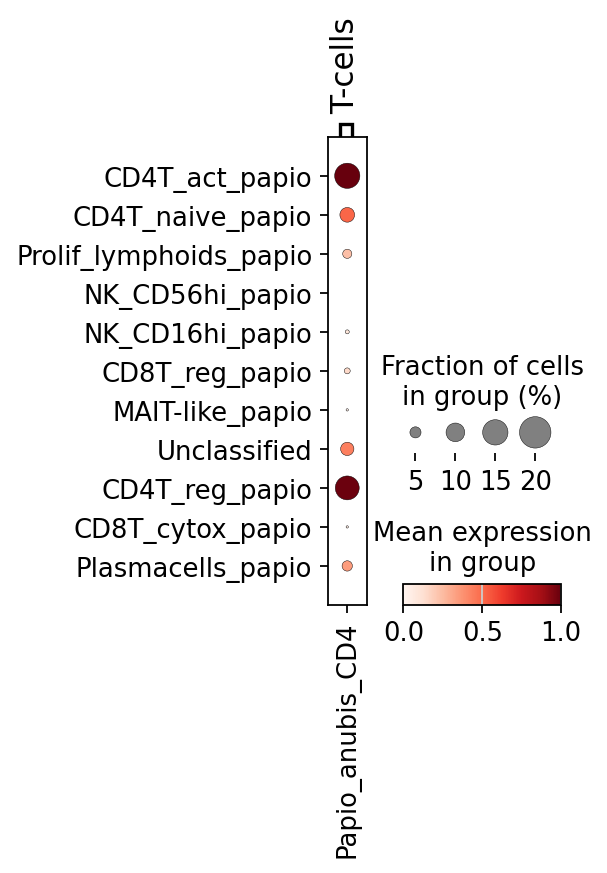

In [49]:
# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_CD4", "Papio_anubis_CD8A"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# "Could not find keys '['Papio_anubis_CD8B', 'Papio_anubis_CD8'] //// MS4A1+KRT20 entspricht CD20 //// IL2RA entspricht CD25 

# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_CD4"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

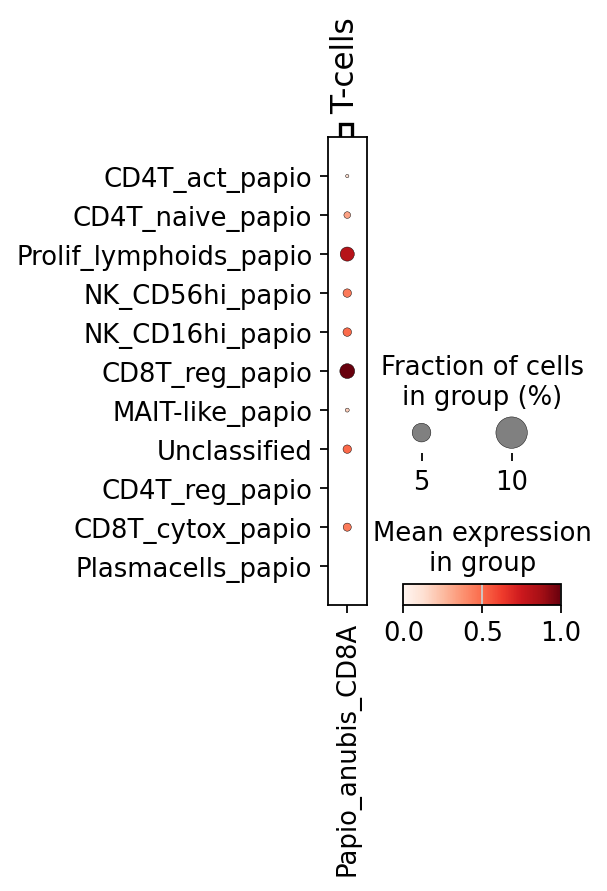

In [50]:

# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_CD8A"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

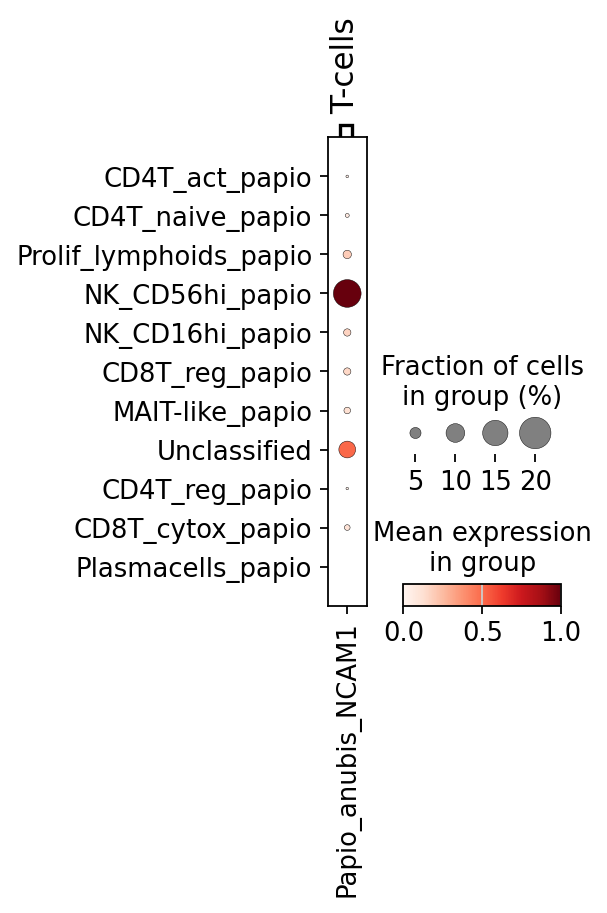

In [51]:

# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_NCAM1"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

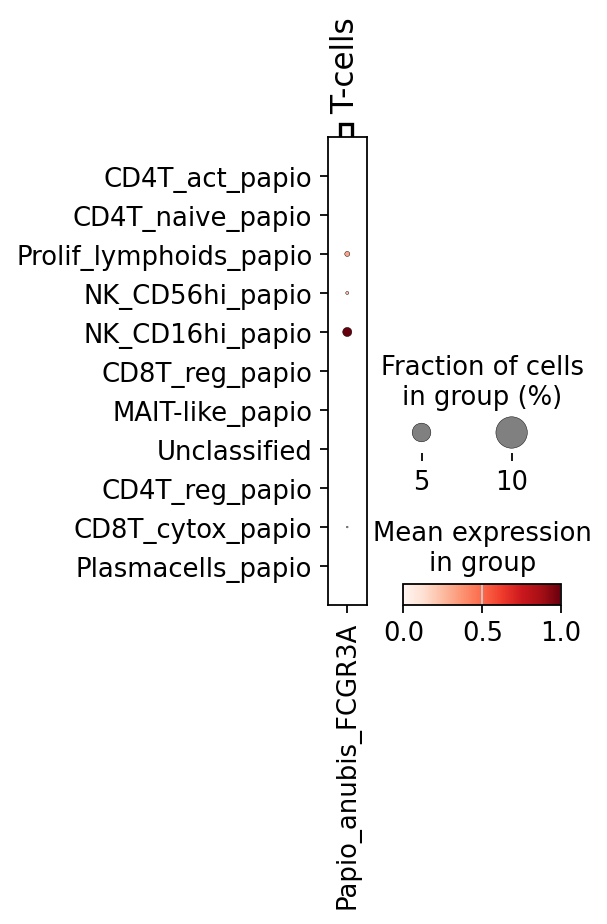

In [52]:

# T_cells: CD4+ or CD8+
marker_genes={ 'T-cells': ["Papio_anubis_FCGR3A"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# Hypoxia genes in Lymphoids

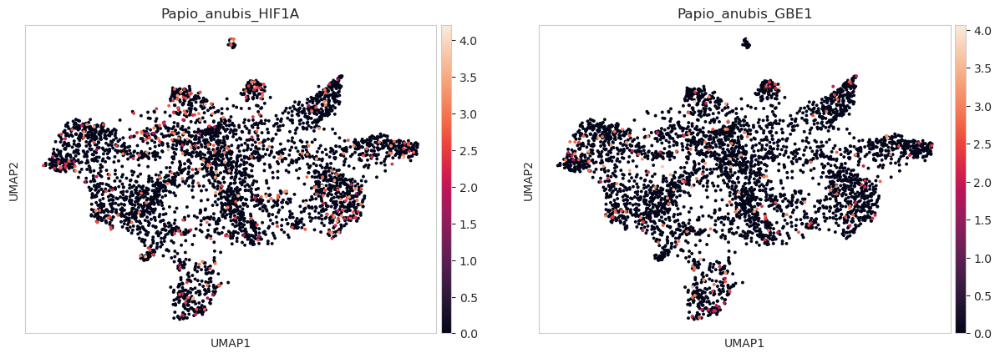

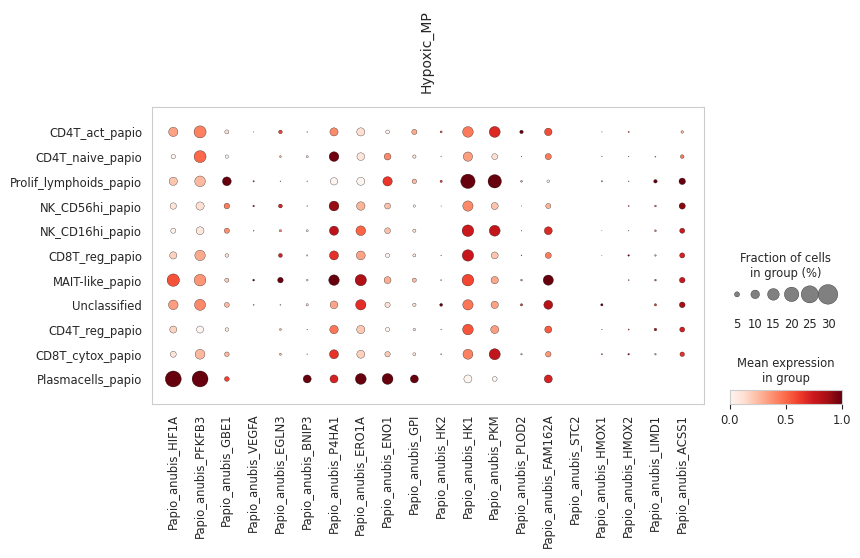

In [46]:
sc.pl.umap(adata, color=["Papio_anubis_HIF1A", "Papio_anubis_GBE1"])

marker_genes={ 'Hypoxic_MP': ["Papio_anubis_HIF1A", "Papio_anubis_PFKFB3", "Papio_anubis_GBE1", "Papio_anubis_VEGFA", "Papio_anubis_EGLN3", "Papio_anubis_BNIP3", "Papio_anubis_P4HA1", "Papio_anubis_ERO1A", "Papio_anubis_ENO1", 
                              "Papio_anubis_GPI", "Papio_anubis_HK2","Papio_anubis_HK1", "Papio_anubis_PKM", "Papio_anubis_PLOD2", "Papio_anubis_FAM162A", "Papio_anubis_STC2", "Papio_anubis_HMOX1", "Papio_anubis_HMOX2", "Papio_anubis_LIMD1", "Papio_anubis_ACSS1"]
 }             
cell_types = ['Hypoxic_MP']
            
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"
)

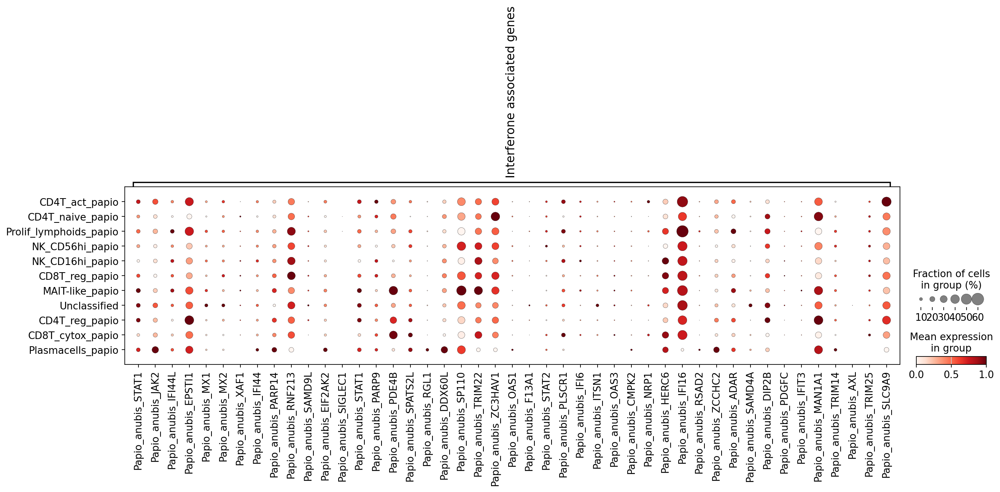

In [55]:
# Interferone associated genes

# Markers of Lymphoid dentritic cells according: https://pmc.ncbi.nlm.nih.gov/articles/PMC5904714/

marker_genes={ 'Interferone associated genes': ["Papio_anubis_STAT1","Papio_anubis_JAK2", "Papio_anubis_IFI44L", "Papio_anubis_EPSTI1", "Papio_anubis_MX1", "Papio_anubis_MX2", "Papio_anubis_XAF1", "Papio_anubis_IFI44", "Papio_anubis_PARP14", "Papio_anubis_RNF213", "Papio_anubis_SAMD9L", "Papio_anubis_EIF2AK2", "Papio_anubis_SIGLEC1", "Papio_anubis_STAT1", "Papio_anubis_PARP9", "Papio_anubis_PDE4B", "Papio_anubis_SPATS2L", "Papio_anubis_RGL1", "Papio_anubis_DDX60L", "Papio_anubis_SP110", "Papio_anubis_TRIM22", "Papio_anubis_ZC3HAV1", "Papio_anubis_OAS1", "Papio_anubis_F13A1", "Papio_anubis_STAT2", "Papio_anubis_PLSCR1", "Papio_anubis_IFI6", "Papio_anubis_ITSN1", "Papio_anubis_OAS3", "Papio_anubis_CMPK2", "Papio_anubis_NRP1", "Papio_anubis_HERC6", "Papio_anubis_IFI16", "Papio_anubis_RSAD2", "Papio_anubis_ZCCHC2", "Papio_anubis_ADAR", "Papio_anubis_SAMD4A", "Papio_anubis_DIP2B", "Papio_anubis_PDGFC", "Papio_anubis_IFIT3", "Papio_anubis_MAN1A1", "Papio_anubis_TRIM14", "Papio_anubis_AXL", "Papio_anubis_TRIM25", "Papio_anubis_SLC9A9"
                                  
                                  ]}
cell_types = ['Interferone associated genes']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# CD4+  cells 

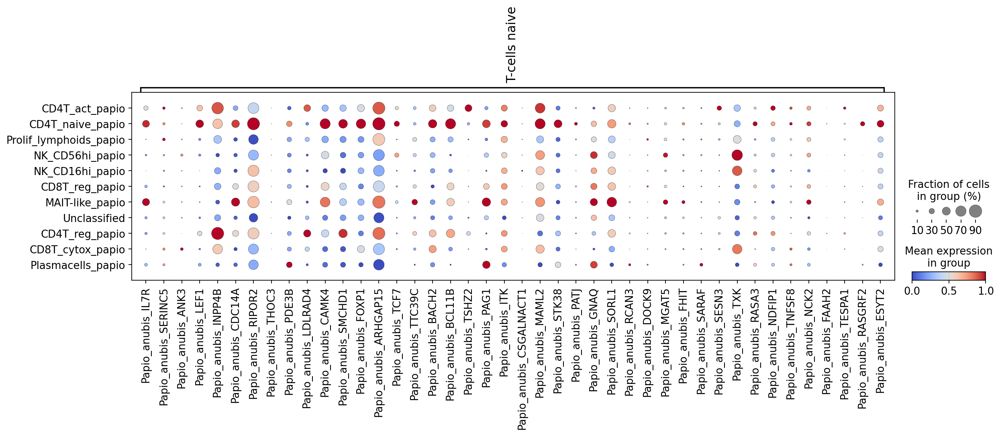

In [36]:
# T_cells naive

marker_genes={ 'T-cells naive': ['Papio_anubis_IL7R', 'Papio_anubis_SERINC5', 'Papio_anubis_ANK3', 
'Papio_anubis_LEF1', 'Papio_anubis_INPP4B', 'Papio_anubis_CDC14A', 'Papio_anubis_RIPOR2', 
'Papio_anubis_THOC3', 'Papio_anubis_PDE3B', 'Papio_anubis_LDLRAD4', 'Papio_anubis_CAMK4', 
'Papio_anubis_SMCHD1', 'Papio_anubis_FOXP1', 'Papio_anubis_ARHGAP15', 'Papio_anubis_TCF7', 
'Papio_anubis_TTC39C', 'Papio_anubis_BACH2', 'Papio_anubis_BCL11B', 'Papio_anubis_TSHZ2', 
'Papio_anubis_PAG1', 'Papio_anubis_ITK', 'Papio_anubis_CSGALNACT1', 'Papio_anubis_MAML2', 
'Papio_anubis_STK38', 'Papio_anubis_PATJ', 'Papio_anubis_GNAQ', 'Papio_anubis_SORL1', 
'Papio_anubis_RCAN3', 'Papio_anubis_DOCK9', 'Papio_anubis_MGAT5', 'Papio_anubis_FHIT', 
'Papio_anubis_SARAF', 'Papio_anubis_SESN3', 'Papio_anubis_TXK', 'Papio_anubis_RASA3', 
'Papio_anubis_NDFIP1', 'Papio_anubis_TNFSF8', 'Papio_anubis_NCK2', 'Papio_anubis_FAAH2', 
'Papio_anubis_TESPA1', 'Papio_anubis_RASGRF2', 'Papio_anubis_ESYT2'


                                
                                ]}
cell_types = ['T-cells naive']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var",
    cmap='coolwarm'
)




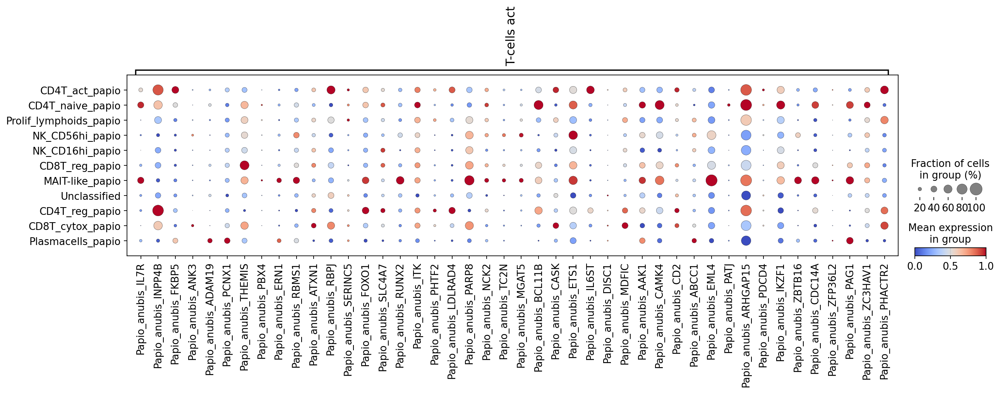

In [37]:
# T_cells act

marker_genes={ 'T-cells act': ['Papio_anubis_IL7R', 'Papio_anubis_INPP4B', 'Papio_anubis_FKBP5', 'Papio_anubis_ANK3', 
'Papio_anubis_ADAM19', 'Papio_anubis_PCNX1', 'Papio_anubis_THEMIS', 'Papio_anubis_PBX4', 
'Papio_anubis_ERN1', 'Papio_anubis_RBMS1', 'Papio_anubis_ATXN1', 'Papio_anubis_RBPJ', 
'Papio_anubis_SERINC5', 'Papio_anubis_FOXO1', 'Papio_anubis_SLC4A7', 'Papio_anubis_RUNX2', 
'Papio_anubis_ITK', 'Papio_anubis_PHTF2', 'Papio_anubis_LDLRAD4', 'Papio_anubis_PARP8', 
'Papio_anubis_NCK2', 'Papio_anubis_TC2N', 'Papio_anubis_MGAT5', 'Papio_anubis_BCL11B', 
'Papio_anubis_CASK', 'Papio_anubis_ETS1', 'Papio_anubis_IL6ST', 'Papio_anubis_DISC1', 
'Papio_anubis_MDFIC', 'Papio_anubis_AAK1', 'Papio_anubis_CAMK4', 'Papio_anubis_CD2', 
'Papio_anubis_ABCC1', 'Papio_anubis_EML4', 'Papio_anubis_PATJ', 'Papio_anubis_ARHGAP15', 
'Papio_anubis_PDCD4', 'Papio_anubis_IKZF1', 'Papio_anubis_ZBTB16', 'Papio_anubis_CDC14A', 
'Papio_anubis_ZFP36L2', 'Papio_anubis_PAG1', 'Papio_anubis_ZC3HAV1', 'Papio_anubis_PHACTR2'
],
}

cell_types = ['T-cells act']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var",
    cmap='coolwarm'
)



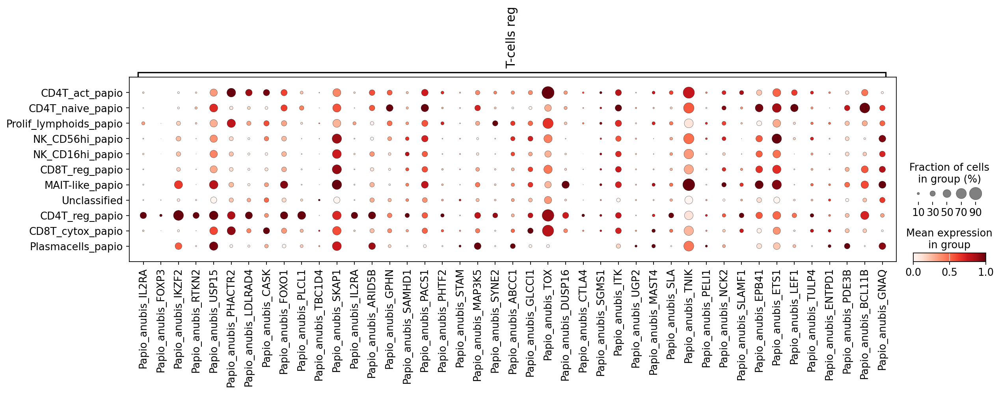

In [38]:
# T_cells reg

marker_genes={ 'T-cells reg': ['Papio_anubis_IL2RA', 'Papio_anubis_FOXP3', 'Papio_anubis_IKZF2', 'Papio_anubis_RTKN2', 'Papio_anubis_USP15', 'Papio_anubis_PHACTR2', 
'Papio_anubis_LDLRAD4', 'Papio_anubis_CASK', 'Papio_anubis_FOXO1', 'Papio_anubis_PLCL1', 
'Papio_anubis_TBC1D4', 'Papio_anubis_SKAP1', 'Papio_anubis_IL2RA', 'Papio_anubis_ARID5B', 
'Papio_anubis_GPHN', 'Papio_anubis_SAMHD1', 'Papio_anubis_PACS1', 'Papio_anubis_PHTF2', 
'Papio_anubis_STAM', 'Papio_anubis_MAP3K5', 'Papio_anubis_SYNE2', 'Papio_anubis_ABCC1', 
'Papio_anubis_GLCCI1', 'Papio_anubis_TOX', 'Papio_anubis_DUSP16', 'Papio_anubis_CTLA4', 
'Papio_anubis_SGMS1', 'Papio_anubis_ITK', 'Papio_anubis_UGP2', 'Papio_anubis_MAST4', 
'Papio_anubis_SLA', 'Papio_anubis_TNIK', 'Papio_anubis_PELI1', 'Papio_anubis_NCK2', 
'Papio_anubis_SLAMF1', 'Papio_anubis_EPB41', 'Papio_anubis_ETS1', 'Papio_anubis_LEF1', 
'Papio_anubis_TULP4', 'Papio_anubis_ENTPD1', 'Papio_anubis_PDE3B', 'Papio_anubis_BCL11B', 
'Papio_anubis_GNAQ'

]}
cell_types = ['T-cells reg']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)



# CD8 positive T-cells 

In [62]:
## CD8 expressing clusters 
#marker_genes={ 'T-cells': ["Papio_anubis_CD8A"]}
#cell_types = ['T-cells']
#
#gene_markers = {
#    ct: [m for m in ct_markers if m in adata.var.index]
#    for ct, ct_markers in marker_genes.items()
#    if ct in cell_types
#}
#
#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_08",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

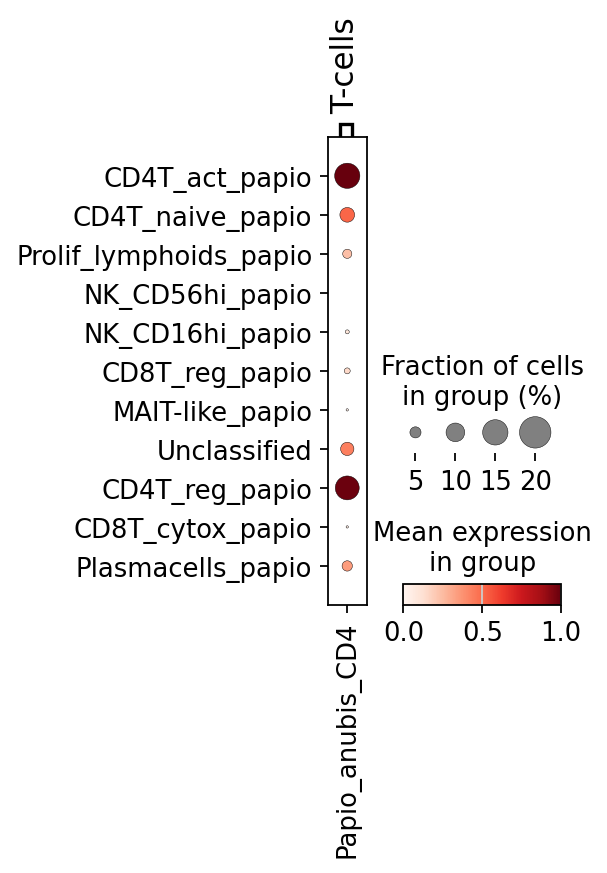

In [63]:
# CD4 expressing clusters 
marker_genes={ 'T-cells': ["Papio_anubis_CD4"]}
cell_types = ['T-cells']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

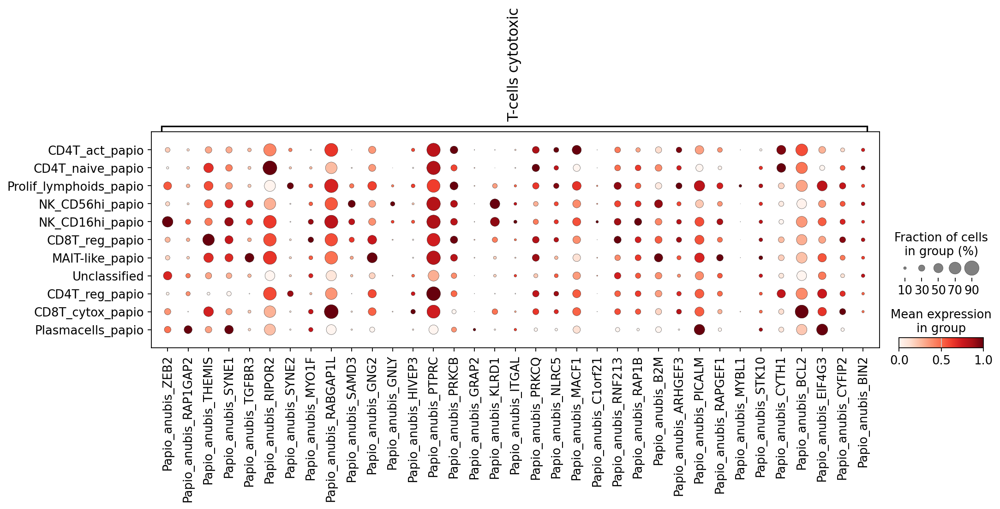

In [64]:
# T_cells cytotoxic -> maybe Cluster 6 or 1  

marker_genes={ 'T-cells cytotoxic': ["Papio_anubis_ZEB2", "Papio_anubis_RAP1GAP2", "Papio_anubis_THEMIS", "Papio_anubis_SYNE1", "Papio_anubis_TGFBR3", "Papio_anubis_RIPOR2", "Papio_anubis_SYNE2", "Papio_anubis_MYO1F", "Papio_anubis_RABGAP1L", "Papio_anubis_SAMD3", "Papio_anubis_GNG2", "Papio_anubis_GNLY", "Papio_anubis_HIVEP3", "Papio_anubis_PTPRC", "Papio_anubis_PRKCB", "Papio_anubis_GRAP2", "Papio_anubis_KLRD1", "Papio_anubis_ITGAL", "Papio_anubis_PRKCQ", "Papio_anubis_NLRC5", "Papio_anubis_MACF1", "Papio_anubis_C1orf21", "Papio_anubis_RNF213", "Papio_anubis_RAP1B", "Papio_anubis_B2M", "Papio_anubis_ARHGEF3", "Papio_anubis_PICALM", "Papio_anubis_RAPGEF1", "Papio_anubis_MYBL1", "Papio_anubis_STK10", "Papio_anubis_CYTH1", "Papio_anubis_BCL2", "Papio_anubis_EIF4G3", "Papio_anubis_CYFIP2", "Papio_anubis_BIN2"

]}
cell_types = ['T-cells cytotoxic']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)





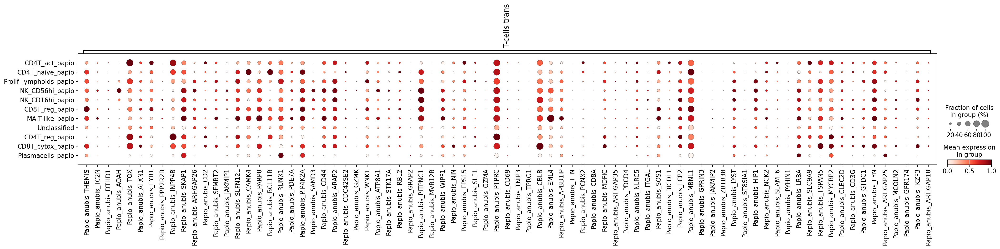

In [65]:
# T_cells trans -> Cluster 


marker_genes={ 'T-cells trans': ["Papio_anubis_THEMIS", "Papio_anubis_TC2N", "Papio_anubis_DTHD1", "Papio_anubis_AOAH", "Papio_anubis_TOX", "Papio_anubis_ATXN1", "Papio_anubis_FYB1", "Papio_anubis_PPP2R2B", "Papio_anubis_INPP4B", "Papio_anubis_SKAP1", "Papio_anubis_ARHGAP26", "Papio_anubis_CD2", "Papio_anubis_SFMBT2", "Papio_anubis_JAKMIP1", "Papio_anubis_SLFN12L", "Papio_anubis_CAMK4", "Papio_anubis_PARP8", "Papio_anubis_BCL11B", "Papio_anubis_RUNX1", "Papio_anubis_PDE7A", "Papio_anubis_PIP4K2A", "Papio_anubis_SAMD3", "Papio_anubis_CD44", "Papio_anubis_ARAP2", "Papio_anubis_CDC42SE2", "Papio_anubis_GZMK", "Papio_anubis_WNK1", "Papio_anubis_ATP8A1", "Papio_anubis_STK17A", "Papio_anubis_RBL2", "Papio_anubis_GRAP2", "Papio_anubis_PITPNC1", "Papio_anubis_MVB12B", "Papio_anubis_WIPF1", "Papio_anubis_NIN", "Papio_anubis_EPS15", "Papio_anubis_SLF1", "Papio_anubis_GZMA", "Papio_anubis_PTPRC", "Papio_anubis_CD69", "Papio_anubis_TNIP3", "Papio_anubis_TPRG1", "Papio_anubis_CBLB", "Papio_anubis_EML4", "Papio_anubis_APBB1IP", "Papio_anubis_TTN", "Papio_anubis_PCNX2", "Papio_anubis_CD8A", "Papio_anubis_MDFIC", "Papio_anubis_ARHGAP35", "Papio_anubis_PDCD4", "Papio_anubis_NLRC5", "Papio_anubis_ITGAL", "Papio_anubis_SOS1", "Papio_anubis_BICDL1", "Papio_anubis_LCP2", "Papio_anubis_MBNL1", "Papio_anubis_GPRIN3", "Papio_anubis_JAKMIP2", "Papio_anubis_ZBTB38", "Papio_anubis_LYST", "Papio_anubis_ST8SIA1", "Papio_anubis_HIP1", "Papio_anubis_NCK2", "Papio_anubis_SLAMF6", "Papio_anubis_PYHIN1", "Papio_anubis_LRBA", "Papio_anubis_SLC9A9", "Papio_anubis_TSPAN5", "Papio_anubis_MYCBP2", "Papio_anubis_CLEC2D", "Papio_anubis_CD3G", "Papio_anubis_GTDC1", "Papio_anubis_FYN", "Papio_anubis_ARHGAP25", "Papio_anubis_MCOLN2", "Papio_anubis_GPR174", "Papio_anubis_IKZF3", "Papio_anubis_ARHGAP18"
]}
cell_types = ['T-cells trans']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

## "Could not find keys '['Papio_anubis_GZMH'#]

#marker_genes={ 'T-cells trans': ["Papio_anubis_THEMIS", "Papio_anubis_TC2N", "Papio_anubis_DTHD1", "Papio_anubis_AOAH", "Papio_anubis_TOX", "Papio_anubis_ATXN1", "Papio_anubis_FYB1", "Papio_anubis_PPP2R2B", "Papio_anubis_INPP4B", "Papio_anubis_SKAP1", "Papio_anubis_ARHGAP26", "Papio_anubis_CD2", "Papio_anubis_SFMBT2", "Papio_anubis_JAKMIP1", "Papio_anubis_SLFN12L", "Papio_anubis_CAMK4", "Papio_anubis_PARP8", "Papio_anubis_BCL11B", "Papio_anubis_RUNX1", "Papio_anubis_PDE7A", "Papio_anubis_PIP4K2A", "Papio_anubis_SAMD3", "Papio_anubis_CD44", "Papio_anubis_ARAP2", "Papio_anubis_CDC42SE2", "Papio_anubis_GZMK", "Papio_anubis_WNK1", "Papio_anubis_ATP8A1", "Papio_anubis_STK17A", "Papio_anubis_RBL2", "Papio_anubis_GRAP2", "Papio_anubis_PITPNC1", "Papio_anubis_MVB12B", "Papio_anubis_WIPF1", "Papio_anubis_NIN", "Papio_anubis_EPS15", "Papio_anubis_SLF1", "Papio_anubis_GZMA", "Papio_anubis_PTPRC", "Papio_anubis_CD69", "Papio_anubis_TNIP3", "Papio_anubis_TPRG1", "Papio_anubis_CBLB", "Papio_anubis_EML4", "Papio_anubis_APBB1IP", "Papio_anubis_TTN", "Papio_anubis_PCNX2", "Papio_anubis_CD8A", "Papio_anubis_MDFIC", "Papio_anubis_ARHGAP35", "Papio_anubis_PDCD4", "Papio_anubis_NLRC5", "Papio_anubis_ITGAL", "Papio_anubis_SOS1", "Papio_anubis_BICDL1", "Papio_anubis_LCP2", "Papio_anubis_MBNL1", "Papio_anubis_GPRIN3", "Papio_anubis_JAKMIP2", "Papio_anubis_ZBTB38", "Papio_anubis_LYST", "Papio_anubis_ST8SIA1", "Papio_anubis_HIP1", "Papio_anubis_NCK2", "Papio_anubis_SLAMF6", "Papio_anubis_PYHIN1", "Papio_anubis_LRBA", "Papio_anubis_SLC9A9", "Papio_anubis_TSPAN5", "Papio_anubis_MYCBP2", "Papio_anubis_CLEC2D", "Papio_anubis_CD3G", "Papio_anubis_GTDC1", "Papio_anubis_FYN", "Papio_anubis_ARHGAP25", "Papio_anubis_MCOLN2", "Papio_anubis_GPR174", "Papio_anubis_IKZF3", "Papio_anubis_ARHGAP18"
#]}
#cell_types = ['T-cells trans'#]

#gene_markers = {
#    ct: [m for m in ct_markers if m in adata.var.index]
#    for ct, ct_markers in marker_genes.items()
#    if ct in cell_types#
#}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  #
#)#





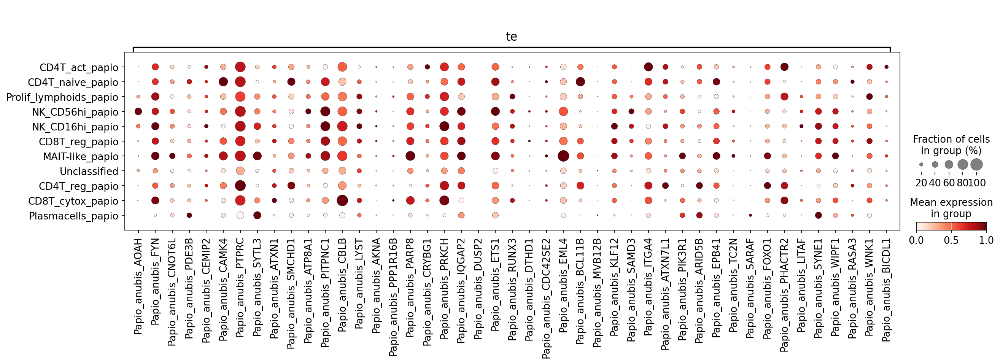

In [40]:
# te 

marker_genes={ 'te': ["Papio_anubis_AOAH", "Papio_anubis_FYN", "Papio_anubis_CNOT6L", "Papio_anubis_PDE3B", "Papio_anubis_CEMIP2", "Papio_anubis_CAMK4", "Papio_anubis_PTPRC", "Papio_anubis_SYTL3", "Papio_anubis_ATXN1", "Papio_anubis_SMCHD1", "Papio_anubis_ATP8A1", "Papio_anubis_PITPNC1", "Papio_anubis_CBLB", "Papio_anubis_LYST", "Papio_anubis_AKNA", "Papio_anubis_PPP1R16B", "Papio_anubis_PARP8", "Papio_anubis_CRYBG1", "Papio_anubis_PRKCH", "Papio_anubis_IQGAP2", "Papio_anubis_DUSP2", "Papio_anubis_ETS1", "Papio_anubis_RUNX3", "Papio_anubis_DTHD1", "Papio_anubis_CDC42SE2", "Papio_anubis_EML4", "Papio_anubis_BCL11B", "Papio_anubis_MVB12B", "Papio_anubis_KLF12", "Papio_anubis_SAMD3", "Papio_anubis_ITGA4", "Papio_anubis_ATXN7L1", "Papio_anubis_PIK3R1", "Papio_anubis_ARID5B", "Papio_anubis_EPB41", "Papio_anubis_TC2N", "Papio_anubis_SARAF", "Papio_anubis_FOXO1", "Papio_anubis_PHACTR2", "Papio_anubis_LITAF", "Papio_anubis_SYNE1", "Papio_anubis_WIPF1", "Papio_anubis_RASA3", "Papio_anubis_WNK1", "Papio_anubis_BICDL1"
]}
cell_types = ['te']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

marker_genes={ 'te': ["Papio_anubis_AOAH", "Papio_anubis_FYN", "Papio_anubis_CNOT6L", "Papio_anubis_PDE3B", "Papio_anubis_CEMIP2", "Papio_anubis_CAMK4", "Papio_anubis_PTPRC", "Papio_anubis_SYTL3", "Papio_anubis_ATXN1", "Papio_anubis_SMCHD1", "Papio_anubis_ATP8A1", "Papio_anubis_PITPNC1", "Papio_anubis_CBLB", "Papio_anubis_LYST", "Papio_anubis_AKNA", "Papio_anubis_PPP1R16B", "Papio_anubis_PARP8", "Papio_anubis_CRYBG1", "Papio_anubis_PRKCH", "Papio_anubis_IQGAP2", "Papio_anubis_DUSP2", "Papio_anubis_ETS1", "Papio_anubis_RUNX3", "Papio_anubis_DTHD1", "Papio_anubis_CDC42SE2", "Papio_anubis_EML4", "Papio_anubis_BCL11B", "Papio_anubis_MVB12B", "Papio_anubis_KLF12", "Papio_anubis_SAMD3", "Papio_anubis_ITGA4", "Papio_anubis_ATXN7L1", "Papio_anubis_PIK3R1", "Papio_anubis_ARID5B", "Papio_anubis_EPB41", "Papio_anubis_TC2N", "Papio_anubis_SARAF", "Papio_anubis_FOXO1", "Papio_anubis_PHACTR2", "Papio_anubis_LITAF", "Papio_anubis_SYNE1", "Papio_anubis_WIPF1", "Papio_anubis_RASA3", "Papio_anubis_WNK1", "Papio_anubis_BICDL1"
]}
cell_types = ['te']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}



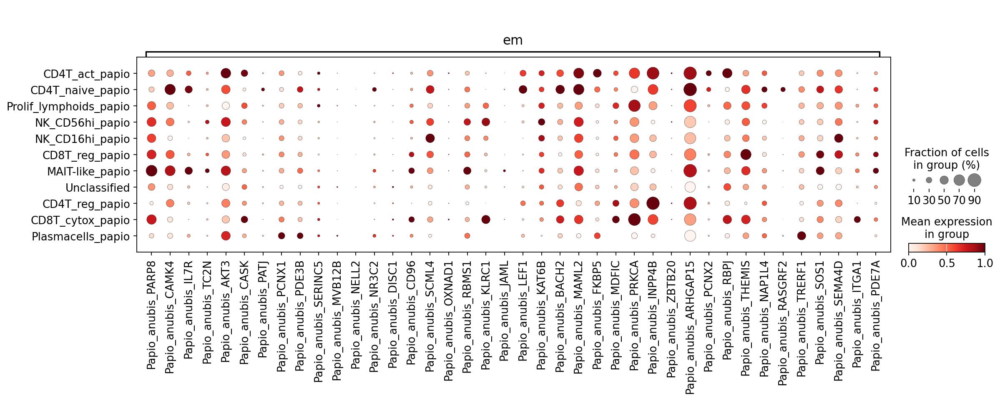

In [41]:
# em -> ggf cluster 9 

marker_genes={ 'em': ["Papio_anubis_PARP8", "Papio_anubis_CAMK4", "Papio_anubis_IL7R", "Papio_anubis_TC2N", "Papio_anubis_AKT3", "Papio_anubis_CASK", "Papio_anubis_PATJ", "Papio_anubis_PCNX1", "Papio_anubis_PDE3B", "Papio_anubis_SERINC5", "Papio_anubis_MVB12B", "Papio_anubis_NELL2", "Papio_anubis_NR3C2", "Papio_anubis_DISC1", "Papio_anubis_CD96", "Papio_anubis_SCML4", "Papio_anubis_OXNAD1", "Papio_anubis_RBMS1", "Papio_anubis_KLRC1", "Papio_anubis_JAML", "Papio_anubis_LEF1", "Papio_anubis_KAT6B", "Papio_anubis_BACH2", "Papio_anubis_MAML2", "Papio_anubis_FKBP5", "Papio_anubis_MDFIC", "Papio_anubis_PRKCA", "Papio_anubis_INPP4B", "Papio_anubis_ZBTB20", "Papio_anubis_ARHGAP15", "Papio_anubis_PCNX2", "Papio_anubis_RBPJ", "Papio_anubis_THEMIS", "Papio_anubis_NAP1L4", "Papio_anubis_RASGRF2", "Papio_anubis_TRERF1", "Papio_anubis_SOS1", "Papio_anubis_SEMA4D", "Papio_anubis_ITGA1", "Papio_anubis_PDE7A"
]}
cell_types = ['em']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

marker_genes={ 'em': ["Papio_anubis_PARP8", "Papio_anubis_CAMK4", "Papio_anubis_IL7R", "Papio_anubis_TC2N", "Papio_anubis_AKT3", "Papio_anubis_CASK", "Papio_anubis_PATJ", "Papio_anubis_PCNX1", "Papio_anubis_PDE3B", "Papio_anubis_SERINC5", "Papio_anubis_MVB12B", "Papio_anubis_NELL2", "Papio_anubis_NR3C2", "Papio_anubis_DISC1", "Papio_anubis_CD96", "Papio_anubis_SCML4", "Papio_anubis_OXNAD1", "Papio_anubis_RBMS1", "Papio_anubis_KLRC1", "Papio_anubis_JAML", "Papio_anubis_LEF1", "Papio_anubis_KAT6B", "Papio_anubis_BACH2", "Papio_anubis_MAML2", "Papio_anubis_FKBP5", "Papio_anubis_MDFIC", "Papio_anubis_PRKCA", "Papio_anubis_INPP4B", "Papio_anubis_ZBTB20", "Papio_anubis_ARHGAP15", "Papio_anubis_PCNX2", "Papio_anubis_RBPJ", "Papio_anubis_THEMIS", "Papio_anubis_NAP1L4", "Papio_anubis_RASGRF2", "Papio_anubis_TRERF1", "Papio_anubis_SOS1", "Papio_anubis_SEMA4D", "Papio_anubis_ITGA1", "Papio_anubis_PDE7A"
]}
cell_types = ['em']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}



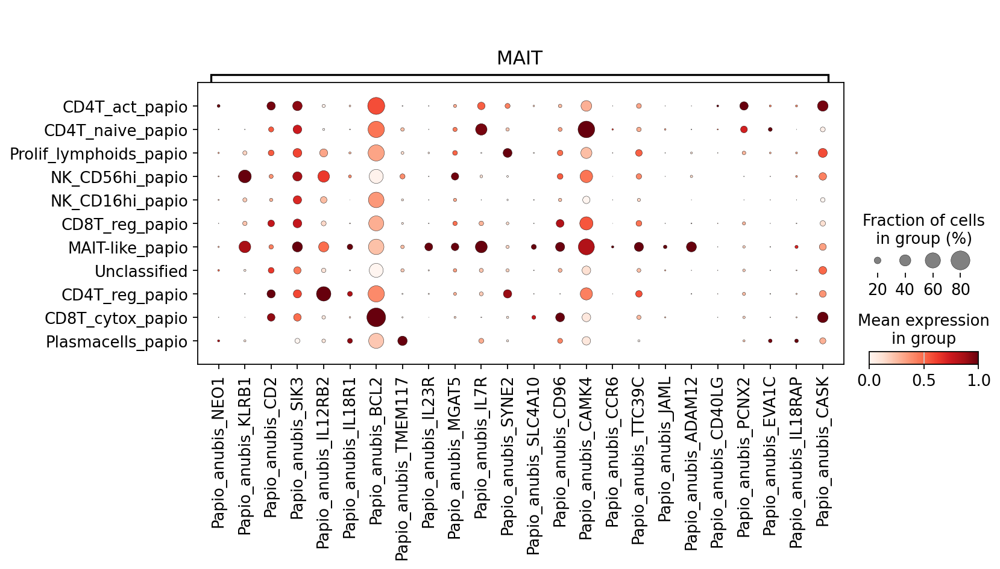

In [68]:
# MAIT -> Cluster 4

marker_genes={ 'MAIT': ["Papio_anubis_NEO1", "Papio_anubis_KLRB1", "Papio_anubis_CD2", "Papio_anubis_SIK3", "Papio_anubis_IL12RB2", "Papio_anubis_IL18R1", "Papio_anubis_BCL2", "Papio_anubis_TMEM117", "Papio_anubis_IL23R", "Papio_anubis_MGAT5", "Papio_anubis_IL7R", "Papio_anubis_SYNE2", "Papio_anubis_SLC4A10", "Papio_anubis_CD96", "Papio_anubis_CAMK4", "Papio_anubis_CCR6", "Papio_anubis_TTC39C", "Papio_anubis_JAML", "Papio_anubis_ADAM12", "Papio_anubis_CD40LG", "Papio_anubis_PCNX2", "Papio_anubis_EVA1C", "Papio_anubis_IL18RAP", "Papio_anubis_CASK"
]}
cell_types = ['MAIT']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

marker_genes={ 'MAIT': ["Papio_anubis_NEO1", "Papio_anubis_KLRB1", "Papio_anubis_CD2", "Papio_anubis_SIK3", "Papio_anubis_IL12RB2", "Papio_anubis_IL18R1", "Papio_anubis_BCL2", "Papio_anubis_TMEM117", "Papio_anubis_IL23R", "Papio_anubis_MGAT5", "Papio_anubis_IL7R", "Papio_anubis_SYNE2", "Papio_anubis_SLC4A10", "Papio_anubis_CD96", "Papio_anubis_CAMK4", "Papio_anubis_CCR6", "Papio_anubis_TTC39C", "Papio_anubis_JAML", "Papio_anubis_ADAM12", "Papio_anubis_CD40LG", "Papio_anubis_PCNX2", "Papio_anubis_EVA1C", "Papio_anubis_IL18RAP", "Papio_anubis_CASK"
]}
cell_types = ['MAIT']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

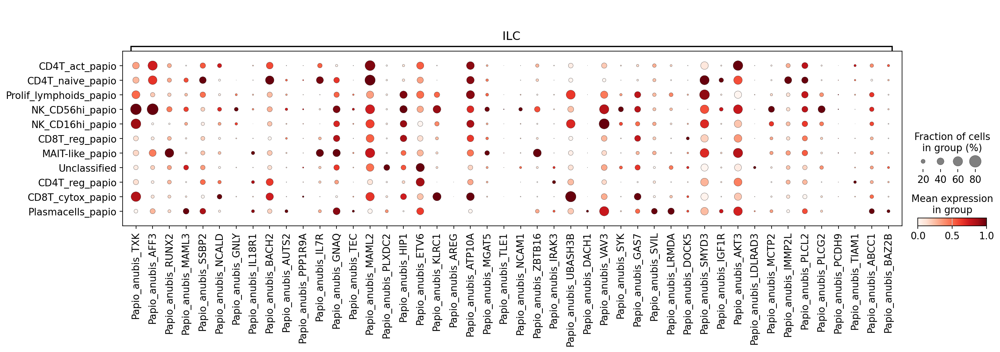

In [69]:
# Innate lymphoid cells (ILC) -> Cluster  

marker_genes={ 'ILC': ['Papio_anubis_TXK', 'Papio_anubis_AFF3', 'Papio_anubis_RUNX2', 'Papio_anubis_MAML3', 'Papio_anubis_SSBP2', 'Papio_anubis_NCALD', 
'Papio_anubis_GNLY', 'Papio_anubis_IL18R1', 'Papio_anubis_BACH2', 'Papio_anubis_AUTS2', 'Papio_anubis_PPP1R9A', 'Papio_anubis_IL7R', 
'Papio_anubis_GNAQ', 'Papio_anubis_TEC', 'Papio_anubis_MAML2', 'Papio_anubis_PLXDC2', 'Papio_anubis_HIP1', 'Papio_anubis_ETV6', 
'Papio_anubis_KLRC1', 'Papio_anubis_AREG', 'Papio_anubis_ATP10A', 'Papio_anubis_MGAT5', 'Papio_anubis_TLE1', 'Papio_anubis_NCAM1', 
'Papio_anubis_ZBTB16', 'Papio_anubis_IRAK3', 'Papio_anubis_UBASH3B', 'Papio_anubis_DACH1', 'Papio_anubis_VAV3', 'Papio_anubis_SYK', 
'Papio_anubis_GAS7', 'Papio_anubis_SVIL', 'Papio_anubis_LRMDA', 'Papio_anubis_DOCK5', 'Papio_anubis_SMYD3', 'Papio_anubis_IGF1R', 
'Papio_anubis_AKT3', 'Papio_anubis_LDLRAD3', 'Papio_anubis_MCTP2', 'Papio_anubis_IMMP2L', 'Papio_anubis_PLCL2', 'Papio_anubis_PLCG2', 
'Papio_anubis_PCDH9', 'Papio_anubis_TIAM1', 'Papio_anubis_ABCC1', 'Papio_anubis_BAZ2B'
]}
cell_types = ['ILC']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

# Innate lymphoid cells (ILC) -> Cluster  

marker_genes={ 'ILC': ['Papio_anubis_TXK', 'Papio_anubis_AFF3', 'Papio_anubis_RUNX2', 'Papio_anubis_MAML3', 'Papio_anubis_SSBP2', 'Papio_anubis_NCALD', 
'Papio_anubis_GNLY', 'Papio_anubis_IL18R1', 'Papio_anubis_BACH2', 'Papio_anubis_AUTS2', 'Papio_anubis_PPP1R9A', 'Papio_anubis_IL7R', 
'Papio_anubis_GNAQ', 'Papio_anubis_TEC', 'Papio_anubis_MAML2', 'Papio_anubis_PLXDC2', 'Papio_anubis_HIP1', 'Papio_anubis_ETV6', 
'Papio_anubis_KLRC1', 'Papio_anubis_AREG', 'Papio_anubis_ATP10A', 'Papio_anubis_MGAT5', 'Papio_anubis_TLE1', 'Papio_anubis_NCAM1', 
'Papio_anubis_ZBTB16', 'Papio_anubis_IRAK3', 'Papio_anubis_UBASH3B', 'Papio_anubis_DACH1', 'Papio_anubis_VAV3', 'Papio_anubis_SYK', 
'Papio_anubis_GAS7', 'Papio_anubis_SVIL', 'Papio_anubis_LRMDA', 'Papio_anubis_DOCK5', 'Papio_anubis_SMYD3', 'Papio_anubis_IGF1R', 
'Papio_anubis_AKT3', 'Papio_anubis_LDLRAD3', 'Papio_anubis_MCTP2', 'Papio_anubis_IMMP2L', 'Papio_anubis_PLCL2', 'Papio_anubis_PLCG2', 
'Papio_anubis_PCDH9', 'Papio_anubis_TIAM1', 'Papio_anubis_ABCC1', 'Papio_anubis_BAZ2B'
]}
cell_types = ['ILC']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# NK cells 

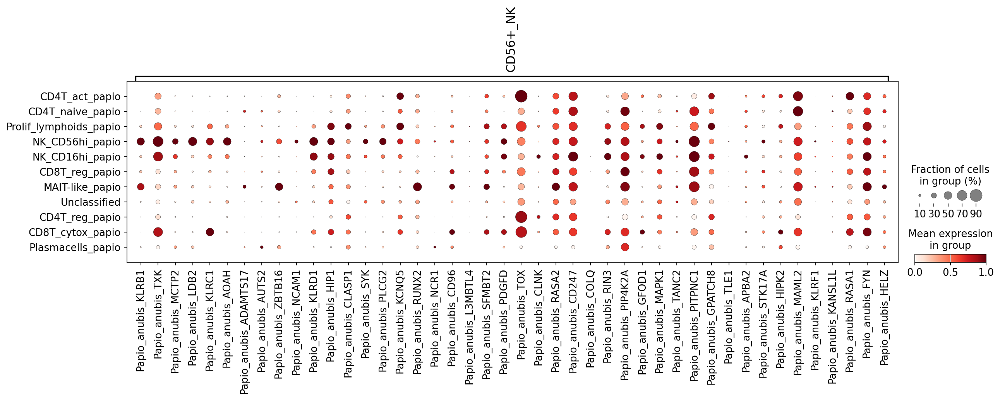

In [70]:
# NK : CD56+ NK cells -> Cluster 2 in leiden_10

marker_genes={ 'CD56+_NK': ["Papio_anubis_KLRB1", "Papio_anubis_TXK", "Papio_anubis_MCTP2", "Papio_anubis_LDB2", "Papio_anubis_KLRC1", "Papio_anubis_AOAH", "Papio_anubis_ADAMTS17", "Papio_anubis_AUTS2", "Papio_anubis_ZBTB16", "Papio_anubis_NCAM1", "Papio_anubis_KLRD1", "Papio_anubis_HIP1", "Papio_anubis_CLASP1", "Papio_anubis_SYK", "Papio_anubis_PLCG2", "Papio_anubis_KCNQ5", "Papio_anubis_RUNX2", "Papio_anubis_NCR1", "Papio_anubis_CD96", "Papio_anubis_L3MBTL4", "Papio_anubis_SFMBT2", "Papio_anubis_PDGFD", "Papio_anubis_TOX", "Papio_anubis_CLNK", "Papio_anubis_RASA2", "Papio_anubis_CD247", "Papio_anubis_COLQ", "Papio_anubis_RIN3", "Papio_anubis_PIP4K2A", "Papio_anubis_GFOD1", "Papio_anubis_MAPK1", "Papio_anubis_TANC2", "Papio_anubis_PITPNC1", "Papio_anubis_GPATCH8", "Papio_anubis_TLE1", "Papio_anubis_APBA2", "Papio_anubis_STK17A", "Papio_anubis_HIPK2", "Papio_anubis_MAML2", "Papio_anubis_KLRF1", "Papio_anubis_KANSL1L", "Papio_anubis_RASA1", "Papio_anubis_FYN", "Papio_anubis_HELZ"
]}
cell_types = ['CD56+_NK']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)


marker_genes={ 'CD56+_NK': ["Papio_anubis_KLRB1", "Papio_anubis_TXK", "Papio_anubis_MCTP2", "Papio_anubis_LDB2", "Papio_anubis_KLRC1", "Papio_anubis_AOAH", "Papio_anubis_ADAMTS17", "Papio_anubis_AUTS2", "Papio_anubis_ZBTB16", "Papio_anubis_NCAM1", "Papio_anubis_KLRD1", "Papio_anubis_HIP1", "Papio_anubis_CLASP1", "Papio_anubis_SYK", "Papio_anubis_PLCG2", "Papio_anubis_KCNQ5", "Papio_anubis_RUNX2", "Papio_anubis_NCR1", "Papio_anubis_CD96", "Papio_anubis_L3MBTL4", "Papio_anubis_SFMBT2", "Papio_anubis_PDGFD", "Papio_anubis_TOX", "Papio_anubis_CLNK", "Papio_anubis_RASA2", "Papio_anubis_CD247", "Papio_anubis_COLQ", "Papio_anubis_RIN3", "Papio_anubis_PIP4K2A", "Papio_anubis_GFOD1", "Papio_anubis_MAPK1", "Papio_anubis_TANC2", "Papio_anubis_PITPNC1", "Papio_anubis_GPATCH8", "Papio_anubis_TLE1", "Papio_anubis_APBA2", "Papio_anubis_STK17A", "Papio_anubis_HIPK2", "Papio_anubis_MAML2", "Papio_anubis_KLRF1", "Papio_anubis_KANSL1L", "Papio_anubis_RASA1", "Papio_anubis_FYN", "Papio_anubis_HELZ"
]}
cell_types = ['CD56+_NK']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

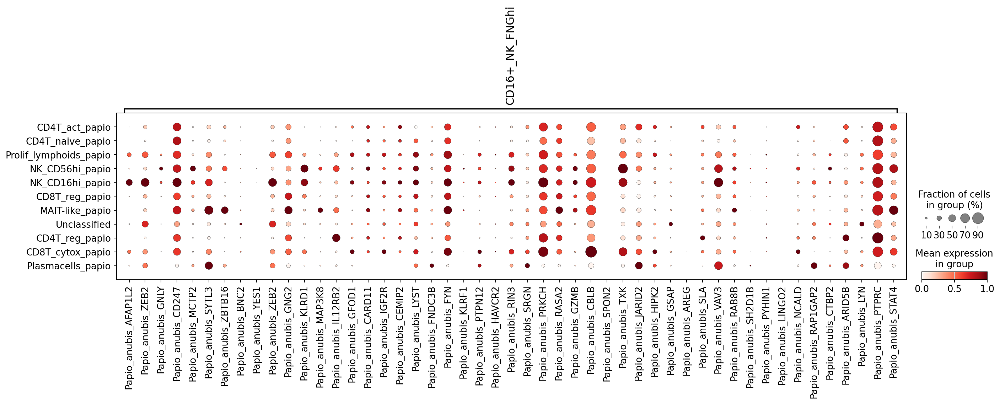

In [71]:
# NK -> CD16+ NK cells_FNGhi

marker_genes={ 'CD16+_NK_FNGhi': ["Papio_anubis_AFAP1L2", "Papio_anubis_ZEB2","Papio_anubis_GNLY", "Papio_anubis_CD247", "Papio_anubis_MCTP2", "Papio_anubis_SYTL3", "Papio_anubis_ZBTB16", "Papio_anubis_BNC2", "Papio_anubis_YES1", "Papio_anubis_ZEB2", "Papio_anubis_GNG2", "Papio_anubis_KLRD1", "Papio_anubis_MAP3K8", "Papio_anubis_IL12RB2", "Papio_anubis_GFOD1", "Papio_anubis_CARD11", "Papio_anubis_IGF2R", "Papio_anubis_CEMIP2", "Papio_anubis_LYST", "Papio_anubis_FNDC3B", "Papio_anubis_FYN", "Papio_anubis_KLRF1", "Papio_anubis_PTPN12", "Papio_anubis_HAVCR2", "Papio_anubis_RIN3", "Papio_anubis_SRGN", "Papio_anubis_PRKCH", "Papio_anubis_RASA2", "Papio_anubis_GZMB", "Papio_anubis_CBLB", "Papio_anubis_SPON2", "Papio_anubis_TXK", "Papio_anubis_JARID2", "Papio_anubis_HIPK2", "Papio_anubis_GSAP", "Papio_anubis_AREG", "Papio_anubis_SLA", "Papio_anubis_VAV3", "Papio_anubis_RAB8B", "Papio_anubis_SH2D1B", "Papio_anubis_PYHIN1", "Papio_anubis_LINGO2", "Papio_anubis_NCALD", "Papio_anubis_RAP1GAP2", "Papio_anubis_CTBP2", "Papio_anubis_ARID5B", "Papio_anubis_LYN", "Papio_anubis_PTPRC", "Papio_anubis_STAT4"
]}
cell_types = ['CD16+_NK_FNGhi']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

# (ZEB2+/AFAP1L2+)

marker_genes={ 'CD16+_NK_FNGhi': ["Papio_anubis_AFAP1L2", "Papio_anubis_ZEB2","Papio_anubis_GNLY", "Papio_anubis_CD247", "Papio_anubis_MCTP2", "Papio_anubis_SYTL3", "Papio_anubis_ZBTB16", "Papio_anubis_BNC2", "Papio_anubis_YES1", "Papio_anubis_ZEB2", "Papio_anubis_GNG2", "Papio_anubis_KLRD1", "Papio_anubis_MAP3K8", "Papio_anubis_IL12RB2", "Papio_anubis_GFOD1", "Papio_anubis_CARD11", "Papio_anubis_IGF2R", "Papio_anubis_CEMIP2", "Papio_anubis_LYST", "Papio_anubis_FNDC3B", "Papio_anubis_FYN", "Papio_anubis_KLRF1", "Papio_anubis_PTPN12", "Papio_anubis_HAVCR2", "Papio_anubis_RIN3", "Papio_anubis_SRGN", "Papio_anubis_PRKCH", "Papio_anubis_RASA2", "Papio_anubis_GZMB", "Papio_anubis_CBLB", "Papio_anubis_SPON2", "Papio_anubis_TXK", "Papio_anubis_JARID2", "Papio_anubis_HIPK2", "Papio_anubis_GSAP", "Papio_anubis_AREG", "Papio_anubis_SLA", "Papio_anubis_VAV3", "Papio_anubis_RAB8B", "Papio_anubis_SH2D1B", "Papio_anubis_PYHIN1", "Papio_anubis_LINGO2", "Papio_anubis_NCALD", "Papio_anubis_RAP1GAP2", "Papio_anubis_CTBP2", "Papio_anubis_ARID5B", "Papio_anubis_LYN", "Papio_anubis_PTPRC", "Papio_anubis_STAT4"
]}
cell_types = ['CD16+_NK_FNGhi']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)
#
## (ZEB2+/AFAP1L2+)
#



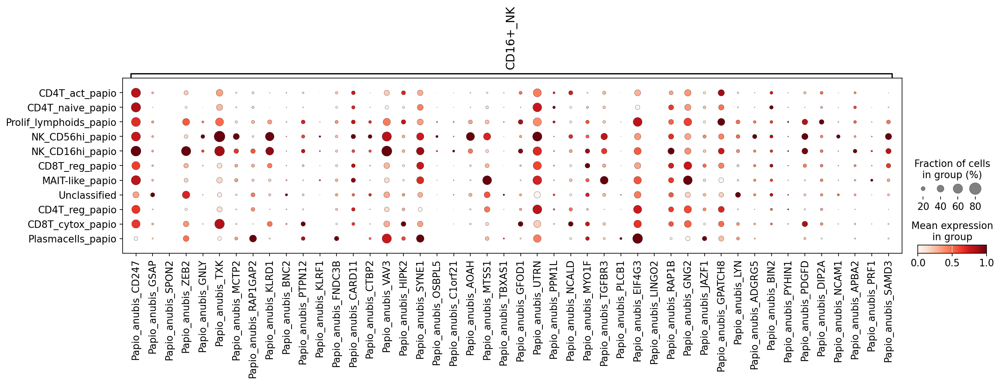

In [72]:
# NK -> CD16+ NK cells_2

marker_genes={ 'CD16+_NK': ['Papio_anubis_CD247', 'Papio_anubis_GSAP', 'Papio_anubis_SPON2', 'Papio_anubis_ZEB2', 'Papio_anubis_GNLY', 'Papio_anubis_TXK', 
'Papio_anubis_MCTP2', 'Papio_anubis_RAP1GAP2', 'Papio_anubis_KLRD1', 'Papio_anubis_BNC2', 'Papio_anubis_PTPN12', 'Papio_anubis_KLRF1', 
'Papio_anubis_FNDC3B', 'Papio_anubis_CARD11', 'Papio_anubis_CTBP2', 'Papio_anubis_VAV3', 'Papio_anubis_HIPK2', 'Papio_anubis_SYNE1', 
'Papio_anubis_OSBPL5', 'Papio_anubis_C1orf21', 'Papio_anubis_AOAH', 'Papio_anubis_MTSS1', 'Papio_anubis_TBXAS1', 'Papio_anubis_GFOD1', 
'Papio_anubis_UTRN', 'Papio_anubis_PPM1L', 'Papio_anubis_NCALD', 'Papio_anubis_MYO1F', 'Papio_anubis_TGFBR3', 'Papio_anubis_PLCB1', 
'Papio_anubis_EIF4G3', 'Papio_anubis_LINGO2', 'Papio_anubis_RAP1B', 'Papio_anubis_GNG2', 'Papio_anubis_JAZF1', 'Papio_anubis_GPATCH8', 
'Papio_anubis_LYN', 'Papio_anubis_ADGRG5', 'Papio_anubis_BIN2', 'Papio_anubis_PYHIN1', 'Papio_anubis_PDGFD', 'Papio_anubis_DIP2A', 
'Papio_anubis_NCAM1', 'Papio_anubis_APBA2', 'Papio_anubis_PRF1', 'Papio_anubis_SAMD3'

]}
cell_types = ['CD16+_NK']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)


marker_genes={ 'CD16+_NK': ['Papio_anubis_CD247', 'Papio_anubis_GSAP', 'Papio_anubis_SPON2', 'Papio_anubis_ZEB2', 'Papio_anubis_GNLY', 'Papio_anubis_TXK', 
'Papio_anubis_MCTP2', 'Papio_anubis_RAP1GAP2', 'Papio_anubis_KLRD1', 'Papio_anubis_BNC2', 'Papio_anubis_PTPN12', 'Papio_anubis_KLRF1', 
'Papio_anubis_FNDC3B', 'Papio_anubis_CARD11', 'Papio_anubis_CTBP2', 'Papio_anubis_VAV3', 'Papio_anubis_HIPK2', 'Papio_anubis_SYNE1', 
'Papio_anubis_OSBPL5', 'Papio_anubis_C1orf21', 'Papio_anubis_AOAH', 'Papio_anubis_MTSS1', 'Papio_anubis_TBXAS1', 'Papio_anubis_GFOD1', 
'Papio_anubis_UTRN', 'Papio_anubis_PPM1L', 'Papio_anubis_NCALD', 'Papio_anubis_MYO1F', 'Papio_anubis_TGFBR3', 'Papio_anubis_PLCB1', 
'Papio_anubis_EIF4G3', 'Papio_anubis_LINGO2', 'Papio_anubis_RAP1B', 'Papio_anubis_GNG2', 'Papio_anubis_JAZF1', 'Papio_anubis_GPATCH8', 
'Papio_anubis_LYN', 'Papio_anubis_ADGRG5', 'Papio_anubis_BIN2', 'Papio_anubis_PYHIN1', 'Papio_anubis_PDGFD', 'Papio_anubis_DIP2A', 
'Papio_anubis_NCAM1', 'Papio_anubis_APBA2', 'Papio_anubis_PRF1', 'Papio_anubis_SAMD3'

]}
cell_types = ['CD16+_NK']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

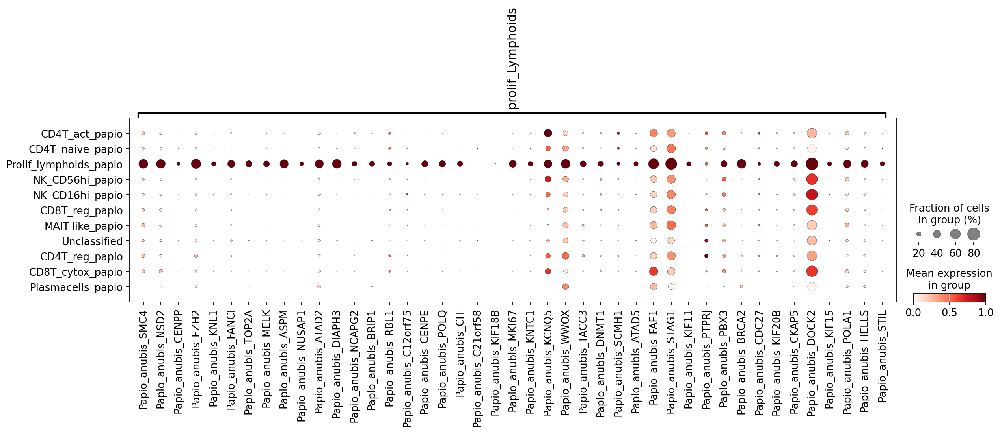

In [73]:
# prolif Lymphoids

marker_genes={ 'prolif_Lymphoids': ["Papio_anubis_SMC4", "Papio_anubis_NSD2", "Papio_anubis_CENPP", "Papio_anubis_EZH2", "Papio_anubis_KNL1", "Papio_anubis_FANCI", "Papio_anubis_TOP2A", "Papio_anubis_MELK", "Papio_anubis_ASPM", "Papio_anubis_NUSAP1", "Papio_anubis_ATAD2", "Papio_anubis_DIAPH3", "Papio_anubis_NCAPG2", "Papio_anubis_BRIP1", "Papio_anubis_RBL1", "Papio_anubis_C12orf75", "Papio_anubis_CENPE", "Papio_anubis_POLQ", "Papio_anubis_CIT", "Papio_anubis_C21orf58", "Papio_anubis_KIF18B", "Papio_anubis_MKI67", "Papio_anubis_KNTC1", "Papio_anubis_KCNQ5", "Papio_anubis_WWOX", "Papio_anubis_TACC3", "Papio_anubis_DNMT1", "Papio_anubis_SCMH1", "Papio_anubis_ATAD5", "Papio_anubis_FAF1", "Papio_anubis_STAG1", "Papio_anubis_KIF11", "Papio_anubis_PTPRJ", "Papio_anubis_PBX3", "Papio_anubis_BRCA2", "Papio_anubis_CDC27", "Papio_anubis_KIF20B", "Papio_anubis_CKAP5", "Papio_anubis_DOCK2", "Papio_anubis_KIF15", "Papio_anubis_POLA1", "Papio_anubis_HELLS", "Papio_anubis_STIL"
]}
cell_types = ['prolif_Lymphoids']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

marker_genes={ 'prolif_Lymphoids': ["Papio_anubis_SMC4", "Papio_anubis_NSD2", "Papio_anubis_CENPP", "Papio_anubis_EZH2", "Papio_anubis_KNL1", "Papio_anubis_FANCI", "Papio_anubis_TOP2A", "Papio_anubis_MELK", "Papio_anubis_ASPM", "Papio_anubis_NUSAP1", "Papio_anubis_ATAD2", "Papio_anubis_DIAPH3", "Papio_anubis_NCAPG2", "Papio_anubis_BRIP1", "Papio_anubis_RBL1", "Papio_anubis_C12orf75", "Papio_anubis_CENPE", "Papio_anubis_POLQ", "Papio_anubis_CIT", "Papio_anubis_C21orf58", "Papio_anubis_KIF18B", "Papio_anubis_MKI67", "Papio_anubis_KNTC1", "Papio_anubis_KCNQ5", "Papio_anubis_WWOX", "Papio_anubis_TACC3", "Papio_anubis_DNMT1", "Papio_anubis_SCMH1", "Papio_anubis_ATAD5", "Papio_anubis_FAF1", "Papio_anubis_STAG1", "Papio_anubis_KIF11", "Papio_anubis_PTPRJ", "Papio_anubis_PBX3", "Papio_anubis_BRCA2", "Papio_anubis_CDC27", "Papio_anubis_KIF20B", "Papio_anubis_CKAP5", "Papio_anubis_DOCK2", "Papio_anubis_KIF15", "Papio_anubis_POLA1", "Papio_anubis_HELLS", "Papio_anubis_STIL"
]}
cell_types = ['prolif_Lymphoids']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# Annotation according to secreted/membrane proteins (DCM paper + secreted/membrane bound protein HPA) 

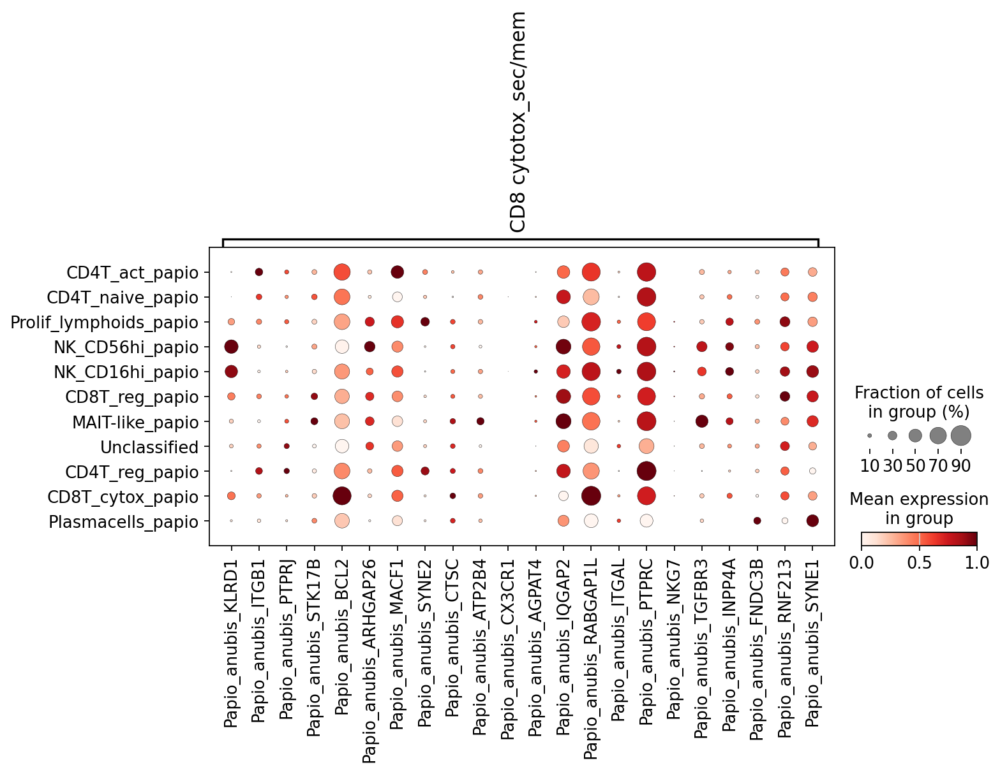

In [74]:
# CD8 cytotox ->


marker_genes={ 'CD8 cytotox_sec/mem': ["Papio_anubis_KLRD1", "Papio_anubis_ITGB1", "Papio_anubis_PTPRJ", "Papio_anubis_STK17B", "Papio_anubis_BCL2", "Papio_anubis_ARHGAP26", "Papio_anubis_MACF1", "Papio_anubis_SYNE2", "Papio_anubis_CTSC", "Papio_anubis_ATP2B4", "Papio_anubis_CX3CR1", "Papio_anubis_AGPAT4", "Papio_anubis_IQGAP2", "Papio_anubis_RABGAP1L", "Papio_anubis_ITGAL", "Papio_anubis_PTPRC", "Papio_anubis_NKG7", "Papio_anubis_TGFBR3", "Papio_anubis_INPP4A", "Papio_anubis_FNDC3B", "Papio_anubis_RNF213", "Papio_anubis_SYNE1"


                       ]}
cell_types = ['CD8 cytotox_sec/mem']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

marker_genes={ 'CD8 cytotox_sec/mem': ["Papio_anubis_KLRD1", "Papio_anubis_ITGB1", "Papio_anubis_PTPRJ", "Papio_anubis_STK17B", "Papio_anubis_BCL2", "Papio_anubis_ARHGAP26", "Papio_anubis_MACF1", "Papio_anubis_SYNE2", "Papio_anubis_CTSC", "Papio_anubis_ATP2B4", "Papio_anubis_CX3CR1", "Papio_anubis_AGPAT4", "Papio_anubis_IQGAP2", "Papio_anubis_RABGAP1L", "Papio_anubis_ITGAL", "Papio_anubis_PTPRC", "Papio_anubis_NKG7", "Papio_anubis_TGFBR3", "Papio_anubis_INPP4A", "Papio_anubis_FNDC3B", "Papio_anubis_RNF213", "Papio_anubis_SYNE1"


                       ]}
cell_types = ['CD8 cytotox_sec/mem']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)




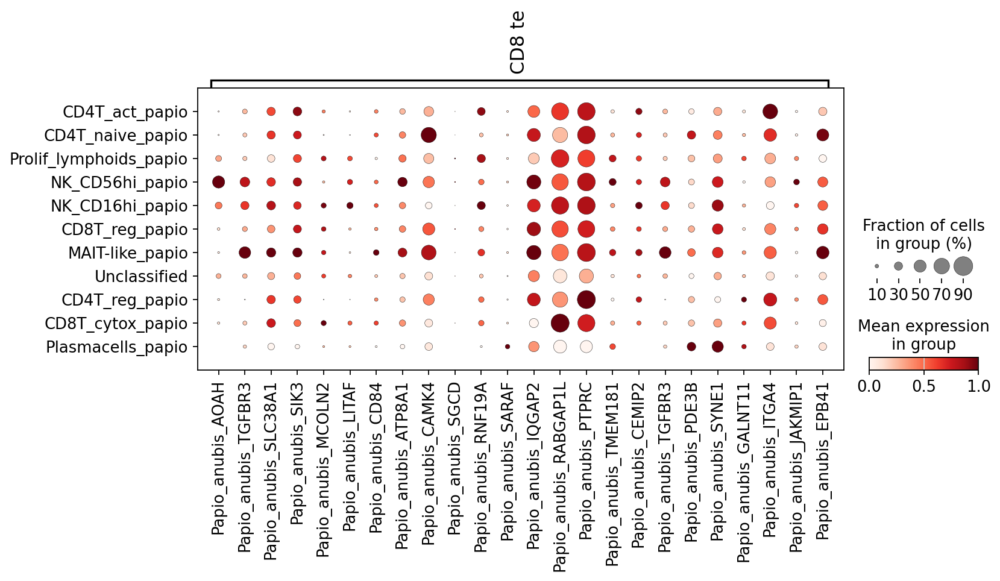

In [75]:
# CD8 te_ membrane/secreted -> cluster 

marker_genes={ 'CD8 te': ["Papio_anubis_AOAH", "Papio_anubis_TGFBR3", "Papio_anubis_SLC38A1", "Papio_anubis_SIK3", "Papio_anubis_MCOLN2", "Papio_anubis_LITAF", "Papio_anubis_CD84", "Papio_anubis_ATP8A1", "Papio_anubis_CAMK4", "Papio_anubis_SGCD", "Papio_anubis_RNF19A", "Papio_anubis_SARAF", "Papio_anubis_IQGAP2", "Papio_anubis_RABGAP1L", "Papio_anubis_PTPRC", "Papio_anubis_TMEM181", "Papio_anubis_CEMIP2", "Papio_anubis_TGFBR3", "Papio_anubis_PDE3B", "Papio_anubis_SYNE1", "Papio_anubis_GALNT11", "Papio_anubis_ITGA4", "Papio_anubis_JAKMIP1", "Papio_anubis_EPB41"

                       ]}

cell_types = ['CD8 te']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var" 
)

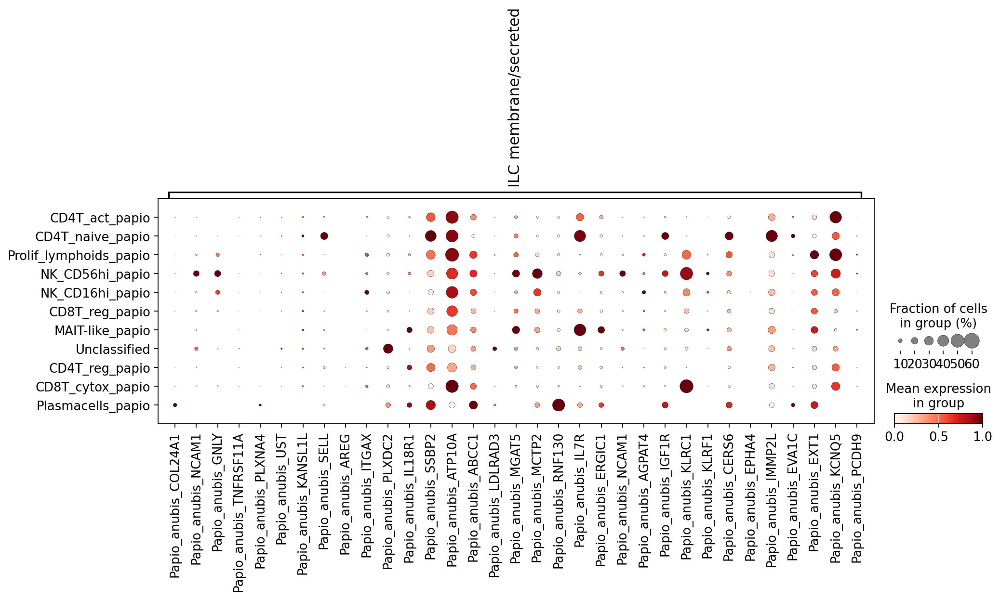

In [76]:
# ILC_membrane/secreted -> cluster

marker_genes={ 'ILC membrane/secreted': ["Papio_anubis_COL24A1", "Papio_anubis_NCAM1", "Papio_anubis_GNLY", "Papio_anubis_TNFRSF11A", "Papio_anubis_PLXNA4", "Papio_anubis_UST", "Papio_anubis_KANSL1L", "Papio_anubis_SELL", "Papio_anubis_AREG", "Papio_anubis_ITGAX", "Papio_anubis_PLXDC2", "Papio_anubis_IL18R1", "Papio_anubis_SSBP2", "Papio_anubis_ATP10A", "Papio_anubis_ABCC1", "Papio_anubis_LDLRAD3", "Papio_anubis_MGAT5", "Papio_anubis_MCTP2", "Papio_anubis_RNF130", "Papio_anubis_IL7R", "Papio_anubis_ERGIC1", "Papio_anubis_NCAM1", "Papio_anubis_AGPAT4", "Papio_anubis_IGF1R", "Papio_anubis_KLRC1", "Papio_anubis_KLRF1", "Papio_anubis_CERS6", "Papio_anubis_EPHA4", "Papio_anubis_IMMP2L", "Papio_anubis_EVA1C", "Papio_anubis_EXT1", "Papio_anubis_KCNQ5", "Papio_anubis_PCDH9"

                       ]}

cell_types = ['ILC membrane/secreted']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var" 
)

# NK_cells differentiation according to CDs

In [78]:
#sc.pl.umap(adata, color=["leiden_named_08"])

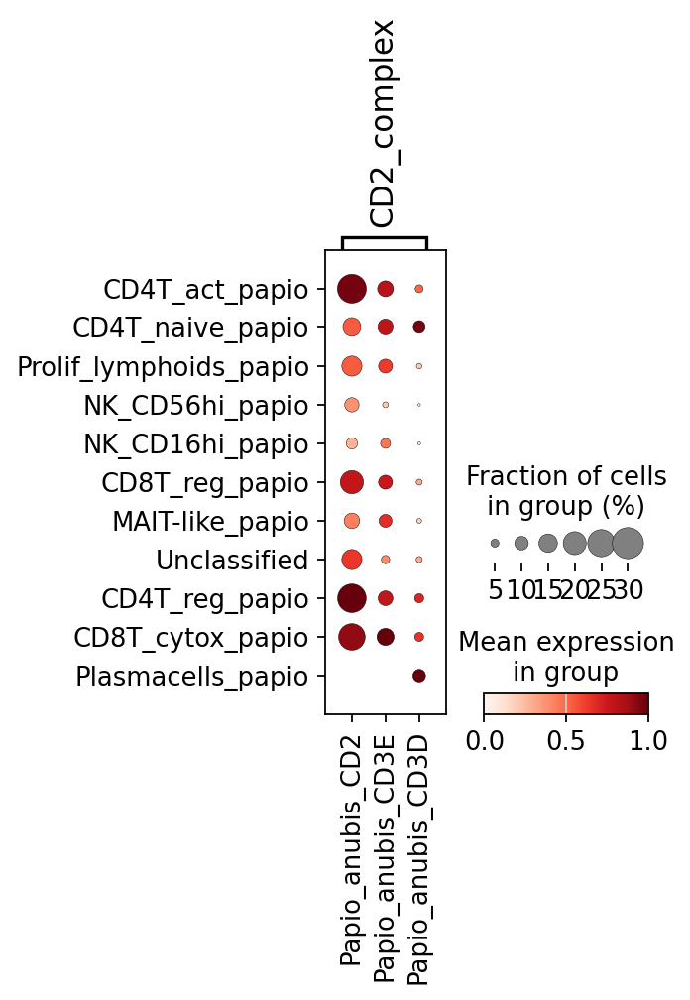

In [79]:
# CD2 should be on T-cells 

marker_genes={ 'CD2_complex': ["Papio_anubis_CD2", "Papio_anubis_CD3E", "Papio_anubis_CD3D"]}
cell_types = ['CD2_complex']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

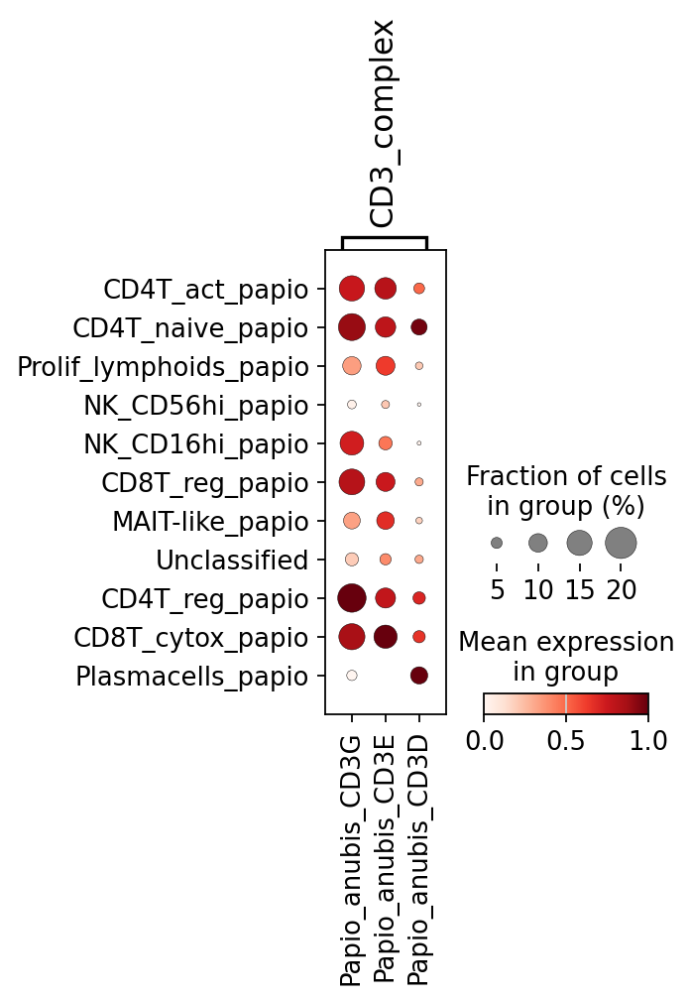

In [81]:
# CD3 complex as T-cell marker complex 
marker_genes={ 'CD3_complex': ["Papio_anubis_CD3G", "Papio_anubis_CD3E", "Papio_anubis_CD3D"]}
cell_types = ['CD3_complex']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_12",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# CD3 complex as T-cell marker complex 
marker_genes={ 'CD3_complex': ["Papio_anubis_CD3G", "Papio_anubis_CD3E", "Papio_anubis_CD3D"]}
cell_types = ['CD3_complex']

gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}

sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)

# Diverse Annotation approach

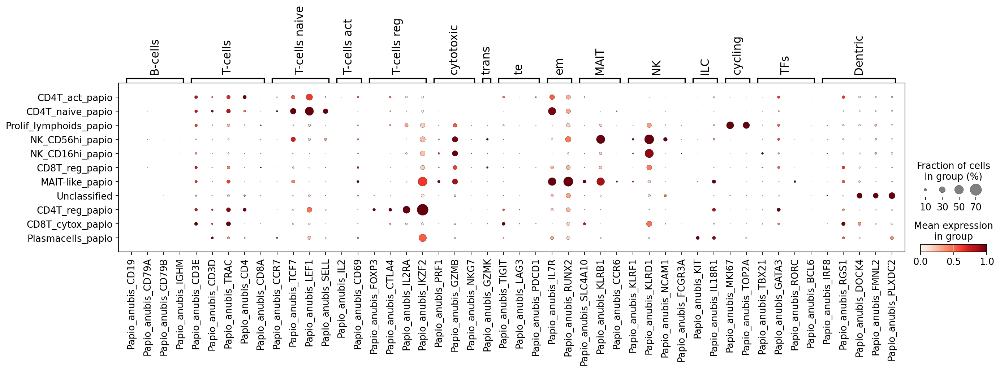

In [91]:

marker_genes={'B-cells': ["Papio_anubis_CD19", "Papio_anubis_CD79A", "Papio_anubis_CD79B", "Papio_anubis_IGHM"],
              'T-cells': ["Papio_anubis_CD3E", "Papio_anubis_CD3D", "Papio_anubis_TRAC", "Papio_anubis_CD4", "Papio_anubis_CD8A"],
              'T-cells naive': ["Papio_anubis_CCR7", "Papio_anubis_TCF7", "Papio_anubis_LEF1", "Papio_anubis_SELL"],
              'T-cells act': ["Papio_anubis_IL2", "Papio_anubis_CD69"],
              'T-cells reg': ["Papio_anubis_FOXP3", "Papio_anubis_CTLA4", "Papio_anubis_IL2RA", "Papio_anubis_IKZF2"],
              'cytotoxic': ["Papio_anubis_PRF1", "Papio_anubis_GZMB", "Papio_anubis_NKG7"],
              'trans': ["Papio_anubis_GZMK"], # , "Papio_anubis_TOX"
              'te': ["Papio_anubis_TIGIT", "Papio_anubis_LAG3", "Papio_anubis_PDCD1"],
              'em': ["Papio_anubis_IL7R", "Papio_anubis_RUNX2"],
              'MAIT': ["Papio_anubis_SLC4A10", "Papio_anubis_KLRB1", "Papio_anubis_CCR6"],
              'NK': ["Papio_anubis_KLRF1", "Papio_anubis_KLRD1", "Papio_anubis_NCAM1", "Papio_anubis_FCGR3A"],
              'ILC': ["Papio_anubis_KIT", "Papio_anubis_IL18R1"],
              'cycling': ["Papio_anubis_MKI67", "Papio_anubis_TOP2A"],
             'TFs': ["Papio_anubis_TBX21", "Papio_anubis_GATA3", "Papio_anubis_RORC", "Papio_anubis_BCL6"],
              'Dentric':["Papio_anubis_IRF8", "Papio_anubis_RGS1", "Papio_anubis_DOCK4", "Papio_anubis_FMNL2", "Papio_anubis_PLXDC2"]
             
             }
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}
sc.pl.dotplot(
    adata,
    groupby="leiden_named_08",
    var_names=marker_genes,
    standard_scale="var"  
)


marker_genes={'B-cells': ["Papio_anubis_CD19", "Papio_anubis_CD79A", "Papio_anubis_CD79B", "Papio_anubis_IGHM"],
              'T-cells': ["Papio_anubis_CD3E", "Papio_anubis_CD3D", "Papio_anubis_TRAC", "Papio_anubis_CD4", "Papio_anubis_CD8A"],
              'T-cells naive': ["Papio_anubis_CCR7", "Papio_anubis_TCF7", "Papio_anubis_LEF1", "Papio_anubis_SELL"],
              'T-cells act': ["Papio_anubis_IL2", "Papio_anubis_CD69"],
              'T-cells reg': ["Papio_anubis_FOXP3", "Papio_anubis_CTLA4", "Papio_anubis_IL2RA", "Papio_anubis_IKZF2"],
              'cytotoxic': ["Papio_anubis_PRF1", "Papio_anubis_GZMB", "Papio_anubis_NKG7"],
              'trans': ["Papio_anubis_GZMK"], # , "Papio_anubis_TOX"
              'te': ["Papio_anubis_TIGIT", "Papio_anubis_LAG3", "Papio_anubis_PDCD1"],
              'em': ["Papio_anubis_IL7R", "Papio_anubis_RUNX2"],
              'MAIT': ["Papio_anubis_SLC4A10", "Papio_anubis_KLRB1", "Papio_anubis_CCR6"],
              'NK': ["Papio_anubis_KLRF1", "Papio_anubis_KLRD1", "Papio_anubis_NCAM1", "Papio_anubis_FCGR3A"],
              'ILC': ["Papio_anubis_KIT", "Papio_anubis_IL18R1"],
              'cycling': ["Papio_anubis_MKI67", "Papio_anubis_TOP2A"],
             'TFs': ["Papio_anubis_TBX21", "Papio_anubis_GATA3", "Papio_anubis_RORC", "Papio_anubis_BCL6"],
              'Dentric':["Papio_anubis_IRF8", "Papio_anubis_RGS1", "Papio_anubis_DOCK4", "Papio_anubis_FMNL2", "Papio_anubis_PLXDC2"]
             
             }
gene_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in cell_types
}
#sc.pl.dotplot(
#    adata,
#    groupby="leiden_named_07",
#    var_names=marker_genes,
#    standard_scale="var"  
#)

# Subclustering CD8+ Cells 

In [ ]:
#sc.pl.umap(adata, color=["leiden_named_12"])

In [ ]:
## AB HIER werden folgen die Schritte zur Clusterreduktion. 
##!!!!!!Jedes Mal muss ich die Zahlen anpassen!!!
#clusters_to_remove = ["2_prolif_Lymphoids (high Ki67+)_NEW", "3_CD56+ NK (KLRB1+/AOAH+)_NEW", "5 CD4+ T-cells naive (LEF1+)_NEW", "6_unknown", "7_CD4+ T-reg (FOXP3+/IL2RA+)_NEW", "8_CD4+ T-cells act_NEW", "10_CD8+", "11_CD16+ NK_NEW", "12_Plasmacells_NEW"]  
#cells_to_remove = adata.obs[adata.obs['leiden_named_12'].isin(clusters_to_remove)].index.tolist()

In [ ]:
#del adata

In [ ]:
#adata=sc.read_h5ad('/data2/core-med1/elindber/PROJECTS/20231020_el_Xenotransplant/results/20240220_el_Xenotransplant_BR_LYMPH_BABOON_RAW.h5ad')

In [ ]:
#adata

In [ ]:
#mask = ~adata.obs.index.isin(cells_to_remove)
#adata = adata[mask].copy()

In [ ]:
#adata

In [ ]:
#adata.write("Lymphoids_CD8pos_only.h5ad")